In [1]:
# In[1] — thread caps (fork-safety / reproducibility)
import os
for v in ('OMP_NUM_THREADS','OPENBLAS_NUM_THREADS','MKL_NUM_THREADS',
          'VECLIB_MAXIMUM_THREADS','NUMEXPR_NUM_THREADS'):
    os.environ[v] = '1'

In [2]:
# In[2] — imports, path, reload, confirm the passthrough is in your repo
import sys, os, importlib, warnings, inspect
warnings.simplefilter(action='ignore', category=FutureWarning)
sys.path.insert(0, os.path.abspath('../../model'))
sys.path.insert(0, os.path.abspath('.'))
sys.path.insert(0, os.path.abspath('../.'))

In [3]:
import os
for v in ('OMP','OPENBLAS','MKL','VECLIB','NUMEXPR'): os.environ[f'{v}_NUM_THREADS']='1'
import importlib, numpy as np, seasonal_scan_harness as ssh; importlib.reload(ssh)
FORC = ssh.build_forcings(['pre+recovery','post'], hplc_coincident=False)
RF_PRE = [0.3, 0.4, 0.5, 0.55, 0.6, 0.65]
PG = {  # construct axes (literature windows; each value single-source):
      'KsZ':[0.15, 0.23, 0.45],        # Ward2012 / Dutk2020 / Dutk2015a (Darwin-lineage, /σ² kernel family)
      'GGE':[0.25, 0.31, 0.33],        # Stock / Taniguchi / Hansen
      'sigma_log':[0.15, 0.20, 0.25],  # Mattern / fitted-mid / Banas2011  (/σ² convention)
      'm_Z':[0.05, 0.10, 0.20],        # quad-closure
      'mP':[0.0015],                   # held (Taniguchi Λ)
      # pinned baseline (frozen): w_sink 5 (routed-scan winner), new sardine-grounded fish routing
      'w_sink':[5.0], 'k_remin':[0.04],
      'fish_fX':[0.25], 'fish_fD':[0.25],          # fish N 0.50 / D 0.25 / export 0.25
      'zq_fD':[0.90], 'zq_fX':[0.0], 'zl_fD':[0.90], 'zl_fX':[0.0]}
res = ssh.run_seasonal_scan(constructs=['maranon_ward'], groups=['pre+recovery'], fish_rates=RF_PRE,
    param_grid=PG, years=60, spinup=15, n_harmonics=3, forcings=FORC, routed=True,
    save_path='seasonal_grid_pre_2026-06-29.pkl', processes=None, maxtasksperchild=1)
print('grid pre done:', len(res.records), '(expect 486 = 81 constructs x 6 r_F)')

[seasonal scan] 486 runs: ['maranon_ward'] x ['pre+recovery'] x fish=[0.3, 0.4, 0.5, 0.55, 0.6, 0.65] x params['KsZ', 'GGE', 'sigma_log', 'm_Z', 'mP', 'w_sink', 'k_remin', 'fish_fX', 'fish_fD', 'zq_fD', 'zq_fX', 'zl_fD', 'zl_fX'] | 60 yr each (spin-up 15)
solver: {'method': 'RK45', 'atol': 1e-09, 'rtol': 1e-06, 'max_step': 1.0, 'instability_neg_threshold': -0.001} | fourier n_harm=3 | processes=cpu-1
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.45]
  grazing : KsZ 0.15  sigma_log 0.15  Q10 2.48
  scalars : GGE 0.25  growth-Q10 1.62  T_ref 20.0
  rates   : mP 0.0015  m_Z(quad) 0.05  m_Zlin 0.05  r_F 0.3
  detritus: k_remin 0.04  w_sink 5.0  ->  L = 125 m
  loss-fate routing (N / D / export):
     phyto mort : N 0.10 / D 0.90 / export 0.00
     graze unas : N 0.25 / D 0.75 / export 0.00
     zoo linear : N 0.10 / D 0.90 / export 0.00
     zoo quad   : N 0.10 / D 0.90 / export 0.00
     fish       : N 0.50 / D 0

In [4]:
import os
for v in ('OMP','OPENBLAS','MKL','VECLIB','NUMEXPR'): os.environ[f'{v}_NUM_THREADS']='1'
import importlib, numpy as np, seasonal_scan_harness as ssh; importlib.reload(ssh)
FORC = ssh.build_forcings(['pre+recovery','post'], hplc_coincident=False)
RF_POST = [0.1, 0.15, 0.2]
PG = {'KsZ':[0.15, 0.23, 0.45], 'GGE':[0.25, 0.31, 0.33], 'sigma_log':[0.15, 0.20, 0.25],
      'm_Z':[0.05, 0.10, 0.20], 'mP':[0.0015],
      'w_sink':[5.0], 'k_remin':[0.04],
      'fish_fX':[0.25], 'fish_fD':[0.25],          # fish N 0.50 / D 0.25 / export 0.25
      'zq_fD':[0.90], 'zq_fX':[0.0], 'zl_fD':[0.90], 'zl_fX':[0.0]}
res = ssh.run_seasonal_scan(constructs=['maranon_ward'], groups=['post'], fish_rates=RF_POST,
    param_grid=PG, years=60, spinup=15, n_harmonics=3, forcings=FORC, routed=True,
    save_path='seasonal_grid_post_2026-06-29.pkl', processes=None, maxtasksperchild=1)
print('grid post done:', len(res.records), '(expect 243 = 81 constructs x 3 r_F)')

[seasonal scan] 243 runs: ['maranon_ward'] x ['post'] x fish=[0.1, 0.15, 0.2] x params['KsZ', 'GGE', 'sigma_log', 'm_Z', 'mP', 'w_sink', 'k_remin', 'fish_fX', 'fish_fD', 'zq_fD', 'zq_fX', 'zl_fD', 'zl_fX'] | 60 yr each (spin-up 15)
solver: {'method': 'RK45', 'atol': 1e-09, 'rtol': 1e-06, 'max_step': 1.0, 'instability_neg_threshold': -0.001} | fourier n_harm=3 | processes=cpu-1
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.45]
  grazing : KsZ 0.15  sigma_log 0.15  Q10 2.48
  scalars : GGE 0.25  growth-Q10 1.62  T_ref 20.0
  rates   : mP 0.0015  m_Z(quad) 0.05  m_Zlin 0.05  r_F 0.1
  detritus: k_remin 0.04  w_sink 5.0  ->  L = 125 m
  loss-fate routing (N / D / export):
     phyto mort : N 0.10 / D 0.90 / export 0.00
     graze unas : N 0.25 / D 0.75 / export 0.00
     zoo linear : N 0.10 / D 0.90 / export 0.00
     zoo quad   : N 0.10 / D 0.90 / export 0.00
     fish       : N 0.50 / D 0.25 / export 0.25
  forc

In [5]:
import numpy as np, pandas as pd, seasonal_scan_harness as ssh
from collections import defaultdict
RP = ssh.load_results('seasonal_grid_pre_2026-06-29.pkl')
RQ = ssh.load_results('seasonal_grid_post_2026-06-29.pkl')
OBS = {'pre+recovery':RP.obs['pre+recovery'], 'post':RQ.obs['post']}
CK = ['KsZ','GGE','sigma_log','m_Z']                 # construct axes (shared across eras)
TARGET, REACH = 0.0035, 0.0030
obs_inv = OBS['post']['med']['Z200'] - OBS['pre+recovery']['med']['Z200']
K5=['mcs','pico','nano','micro','sumP']; W5={k:1. for k in K5}
def fit5(r,g): return float(np.nanmax([ssh.score({k:r.get(k+'_med',np.nan) for k in K5},OBS[g]['med'],W5),
                                       ssh.score({k:r.get(k,np.nan)        for k in K5},OBS[g]['mean'],W5)]))
def iacv(r): return r.get('sumP_sd',np.nan)/max(r.get('sumP',np.nan),1e-9)
def ckey(r): return tuple(round(r[k],4) for k in CK)
Qby=defaultdict(list)
for q in RQ.records: Qby[ckey(q)].append(q)
rows=[]
for p in RP.records:
    for q in Qby.get(ckey(p),[]):
        if q['fish']>p['fish']+1e-9: continue
        inv=q.get('Z200_med',np.nan)-p.get('Z200_med',np.nan)
        row={k:v for k,v in zip(CK,ckey(p))}
        row.update(rF_pre=round(p['fish'],3), rF_post=round(q['fish'],3), inv=round(inv,4),
            joint=round(max(fit5(p,'pre+recovery'),fit5(q,'post')),4),
            cv_pre=round(p.get('cv_sumP',np.nan),2), iaCV_pre=round(iacv(p),3),
            pze_pre=round(p.get('pze',np.nan),3), nan=bool(p.get('has_nan') or q.get('has_nan')))
        rows.append(row)
X=pd.DataFrame(rows); ok=X[(~X.nan)&(X.inv>=REACH)].copy()
print(f"obs med Z>200 inversion {obs_inv:+.4f} (target +{TARGET}; reach +{REACH}) | {len(X)} pairs, {len(ok)} stable+reaching\n")
print("=== TOP 20 by joint fit ==="); print(ok.sort_values(['joint','rF_pre','iaCV_pre']).head(20).to_string(index=False))
print("\n=== CALMEST good candidates (joint<=0.30, sort iaCV_pre then joint) ===")
print(ok[ok.joint<=0.30].sort_values(['iaCV_pre','joint']).head(15).to_string(index=False))
print("\n=== best joint per construct (can it reach?) ===")
print(ok.sort_values('joint').groupby(CK).first().reset_index().sort_values('joint')
        [CK+['rF_pre','rF_post','inv','joint','cv_pre','iaCV_pre']].head(20).to_string(index=False))
print("\n=== marginal: median joint by level (reaching pairs) ===")
for k in CK: print(f"  {k}:", ok.groupby(k)['joint'].median().round(3).to_dict())

obs med Z>200 inversion +0.0035 (target +0.0035; reach +0.003) | 1458 pairs, 506 stable+reaching

=== TOP 20 by joint fit ===
 KsZ  GGE  sigma_log  m_Z  rF_pre  rF_post    inv  joint  cv_pre  iaCV_pre  pze_pre   nan
0.23 0.25       0.25 0.05    0.65     0.15 0.0113 0.1940    1.29     0.260    0.566 False
0.15 0.33       0.20 0.20    0.60     0.15 0.0051 0.2059    1.46     0.145    0.564 False
0.15 0.33       0.20 0.20    0.65     0.15 0.0037 0.2062    1.48     0.218    0.566 False
0.23 0.25       0.25 0.05    0.60     0.15 0.0110 0.2101    1.38     0.281    0.567 False
0.23 0.31       0.25 0.20    0.65     0.15 0.0111 0.2101    1.31     0.236    0.572 False
0.15 0.25       0.20 0.05    0.60     0.10 0.0032 0.2107    1.49     0.311    0.561 False
0.15 0.25       0.20 0.05    0.50     0.10 0.0040 0.2179    1.36     0.212    0.563 False
0.15 0.33       0.20 0.20    0.60     0.10 0.0065 0.2195    1.46     0.145    0.564 False
0.15 0.33       0.20 0.20    0.65     0.10 0.0051 0.2195    1.48

In [21]:
# === Fig 4 overview, callable on scan output =========================================
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.lines import Line2D; from matplotlib.patches import Patch
import seasonal_scan_harness as ssh
from baseline_r0_seasonal_comps import _MID_MONTH_DOY

def _plot_fig4(runs, FISH, ERAS, suptitle, spinup=15):
    SPINUP=spinup; _MO=np.arange(1,13); MO=['J','F','M','A','M','J','J','A','S','O','N','D']
    ECOL={'pre+recovery':'#2E86AB','post':'#E07A5F'}; CLS=[('pico','#E9C46A'),('nano','#2A9D8F'),('micro','#264653')]
    obs_m=ssh.build_obs_monthly(ERAS,forcing_complete=True)
    def doy_to_mo(d): return np.interp(np.asarray(d,float),np.r_[0,_MID_MONTH_DOY,365],np.r_[0.5,_MO.astype(float),12.5])
    def ox(df,col='doy_hplc'):
        d=df[col] if col in df else pd.Series(np.nan,index=df.index)
        return np.where(np.isfinite(d),doy_to_mo(d),df['mo'])
    def _clim(r,k):
        keep=r['t']>=SPINUP*365.0; mo=np.clip(np.searchsorted(ssh._MEDGES,np.mod(r['t'][keep],365.0),'right')+1,1,12)
        v=np.asarray(r[k],float)[keep]; return np.array([np.nanmean(v[mo==m]) if np.any(mo==m) else np.nan for m in _MO])
    def _vals(r,k):
        keep=r['t']>=SPINUP*365.0; t=r['t'][keep]; mo=np.clip(np.searchsorted(ssh._MEDGES,np.mod(t,365.0),'right')+1,1,12)
        yr=(t/365.0).astype(int); v=np.asarray(r[k],float)[keep]
        return np.array([np.nanmean(v[(yr==y)&(mo==m)]) for y in np.unique(yr) for m in _MO if np.any((yr==y)&(mo==m))])
    def _daily(r,k):
        keep=r['t']>=SPINUP*365.0; t=r['t'][keep]; v=np.asarray(r[k],float)[keep]; doy=np.mod(t,365.0); yr=(t/365.0).astype(int); out=[]
        for y in np.unique(yr): m=yr==y; o=np.argsort(doy[m]); out.append((doy[m][o],v[m][o]))
        return out
    def _d2m(d): return np.interp(d,np.r_[0,_MID_MONTH_DOY,365],np.r_[0.5,_MO.astype(float),12.5])
    def _bar(ax,x,vals,c,h=None,w=0.18):
        v=np.asarray(vals,float); v=v[np.isfinite(v)]
        if v.size==0: return
        lo,hi=np.percentile(v,[10,90]); ax.bar(x,np.median(v),w,color=c,alpha=.9,hatch=h,edgecolor='k',lw=.4,zorder=2); ax.plot([x,x],[lo,hi],color='k',lw=.6,zorder=4)
    fig=plt.figure(figsize=(13,13)); gs=GridSpec(4,4,figure=fig,height_ratios=[1,.85,.85,.9],hspace=.5,wspace=.32)
    for col,era in zip([slice(0,2),slice(2,4)],ERAS):
        ax=fig.add_subplot(gs[0,col]); c=ECOL[era]; r=runs[era]; fn,mc=_clim(r,'FN'),_clim(r,'mcs'); o=np.r_[np.arange(12),0]
        ax.plot(fn[o],mc[o],'-o',color=c,lw=1.2,ms=4)
        for m in _MO: ax.annotate(str(m),(fn[m-1],mc[m-1]),fontsize=6,color=c)
        om=obs_m[era].dropna(subset=['FN','mcs']); ax.scatter(om['FN'],om['mcs'],s=16,color='0.4',alpha=.45,lw=0,label='obs')
        ax.set_xlabel('F$_N$'); ax.set_ylabel('mcs (µm)'); ax.set_ylim(bottom=0)
        ax.set_title(f"({'ab'[ERAS.index(era)]}) phase — {era}  r_F={FISH[era]:.3f}",fontsize=9,color=c); ax.legend(fontsize=7,frameon=False)
    for col,era in zip([slice(0,2),slice(2,4)],ERAS):
        ax=fig.add_subplot(gs[1,col]); r=runs[era]; c=ECOL[era]; om=obs_m[era].dropna(subset=['sumP'])
        for doy,v in _daily(r,'sumP'): ax.plot(_d2m(doy),v,'-',color=c,alpha=.12,lw=.5)
        ax.scatter(ox(om),om['sumP'],s=14,color=c,alpha=.4,lw=0,label='obs (DOY)')
        ax.plot(_MO,om.groupby('mo')['sumP'].median().reindex(_MO).values,'-o',color='0.2',lw=1.5,ms=3,label='obs median')
        allv=np.concatenate([v for _,v in _daily(r,'sumP')]+[om['sumP'].to_numpy()])
        ax.set_xlim(.5,12.5); ax.set_xticks(_MO); ax.set_xticklabels(MO,fontsize=7); ax.set_ylim(0,np.max(allv)*1.05)
        ax.set_xlabel('month'); ax.set_ylabel('ΣP (mmolN)'); ax.set_title(f"({'cd'[ERAS.index(era)]}) ΣP seasonal — {era}",fontsize=9,color=c)
        if col.start==0: ax.legend(fontsize=7,frameon=False)
    for col,era in zip([slice(0,2),slice(2,4)],ERAS):
        ax=fig.add_subplot(gs[2,col]); r=runs[era]; om=obs_m[era]
        for cls,cc in CLS:
            for doy,v in _daily(r,cls): ax.plot(_d2m(doy),v,'-',color=cc,alpha=.12,lw=.5)
            o=om.dropna(subset=[cls]); ax.scatter(ox(o),o[cls],s=12,color=cc,alpha=.35,lw=0)
            ax.plot(_MO,o.groupby('mo')[cls].median().reindex(_MO).values,'-o',color=cc,lw=1.6,ms=3)
        ax.set_xlim(.5,12.5); ax.set_xticks(_MO); ax.set_xticklabels(MO,fontsize=7); ax.set_ylim(0,1)
        ax.set_xlabel('month'); ax.set_ylabel('size fraction'); ax.set_title(f"({'ef'[ERAS.index(era)]}) composition — {era}",fontsize=9,color=ECOL[era])
        if col.start==0: ax.legend([Line2D([],[],color=cc,lw=2) for _,cc in CLS]+[Line2D([],[],color='.5',marker='o',ls='',ms=4)],[c for c,_ in CLS]+['obs (DOY)'],fontsize=7,frameon=False,ncol=4,loc='upper center')
    BP=[('(g) mcs',[('mcs','mcs')]),('(h) composition',[('pico','pico'),('nano','nano'),('micro','micro')]),('(i) biomass',[('ΣP','sumP'),('N','N')]),('(j) zoo',[('Z>200','Z200'),('Z>500','Z500')])]
    W=0.18; OFF={('pre+recovery','m'):-1.5*W,('pre+recovery','o'):-.5*W,('post','m'):.5*W,('post','o'):1.5*W}
    for j,(title,metrics) in enumerate(BP):
        ax=fig.add_subplot(gs[3,j])
        for i,(lab,key) in enumerate(metrics):
            for era in ERAS:
                c=ECOL[era]; _bar(ax,i+OFF[(era,'m')],_vals(runs[era],key),c,None,W)
                obs=obs_m[era][key].dropna().to_numpy() if key in obs_m[era].columns else np.array([])
                _bar(ax,i+OFF[(era,'o')],obs,c,'////',W)
        ax.set_xticks(range(len(metrics))); ax.set_xticklabels([m[0] for m in metrics],fontsize=7); ax.set_title(title,fontsize=9); ax.set_ylim(bottom=0); ax.grid(axis='y',ls='--',alpha=.25)
        if j==0: ax.legend([Patch(fc='.6',ec='k'),Patch(fc='.6',ec='k',hatch='////')]+[Patch(fc=ECOL[e]) for e in ERAS],['model','obs']+list(ERAS),fontsize=6,frameon=False)
    fig.suptitle(suptitle,fontsize=10); plt.show()

def fig4_overview(RP, RQ, rF_pre, rF_post, sel=None, construct='maranon_ward',
                  years=60, spinup=15, n_harmonics=3, routed=True, title=None):
    """Re-run + plot the Fig 4 overview for a (pre,post) pair from scan results RP (pre) / RQ (post).
    `sel` disambiguates the swept param, e.g. sel={'KsZ':0.15}. Construct params are taken from the
    PRE record (shared across eras); only r_F differs by era. Returns (runs, clims)."""
    ERAS=['pre+recovery','post']; FISH={'pre+recovery':rF_pre,'post':rF_post}
    spec=ssh.allometry(construct) if isinstance(construct,str) else construct
    def _find(R,f):
        for r in R.records:
            if abs(r['fish']-f)<1e-9 and all(abs(r.get(k,np.nan)-v)<1e-9 for k,v in (sel or {}).items()): return r
        raise ValueError(f"no record fish={f} sel={sel}")
    rec=_find(RP,rF_pre)                                   # shared construct -> reconstruct from pre
    ivo,mP,mZ={},None,None
    for k in RP.param_names:
        v=rec[k]
        if k=='mP': mP=v; continue
        if k=='m_Z': mZ=v; continue
        if k in ('mu_scale','graze_scale'): continue
        slot,key=ssh._PARAM_SLOT[k]; ivo.setdefault(slot,{})[key]=v
    runs,clims={},{}
    for era,f in FISH.items():
        print(f"\n##### {era}  r_F={f} #####"); ssh.describe_run(spec, RP.forcings[era], fish_rate=f,
            mP=mP, m_Z=mZ, iv_overrides=ivo, n_harmonics=n_harmonics, routed=routed)
        clim,r=ssh.run_one(spec, RP.forcings[era], fish_rate=f, mP=mP, m_Z=mZ, iv_overrides=ivo,
            years=years, spinup=spinup, n_harmonics=n_harmonics, routed=routed, return_traj=True)
        runs[era],clims[era]=r,clim
    OBS={'pre+recovery':RP.obs['pre+recovery'],'post':RQ.obs['post']}; K5=['mcs','pico','nano','micro','sumP']; W={k:1. for k in K5}
    f5=lambda c,g: float(np.nanmax([ssh.score({k:c.get(k+'_med',np.nan) for k in K5},OBS[g]['med'],W),
                                    ssh.score({k:c.get(k,np.nan) for k in K5},OBS[g]['mean'],W)]))
    inv=clims['post']['Z200_med']-clims['pre+recovery']['Z200_med']
    print(f"\nfit5 pre {f5(clims['pre+recovery'],'pre+recovery'):.4f} | post {f5(clims['post'],'post'):.4f} "
          f"| inv {inv:+.4f} (obs {OBS['post']['med']['Z200']-OBS['pre+recovery']['med']['Z200']:+.4f}) "
          f"| cv {clims['pre+recovery']['cv_sumP']:.2f}/{clims['post']['cv_sumP']:.2f} "
          f"| pze {clims['pre+recovery']['pze']:.2f}/{clims['post']['pze']:.2f}")
    _plot_fig4(runs, FISH, ERAS, title or f"{spec.get('name','?')} | sel={sel} | rF {rF_pre}/{rF_post}", spinup)
    return runs, clims


##### pre+recovery  r_F=0.5 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.45]
  grazing : KsZ 0.15  sigma_log 0.2  Q10 2.48
  scalars : GGE 0.25  growth-Q10 1.62  T_ref 20.0
  rates   : mP 0.0015  m_Z(quad) 0.05  m_Zlin 0.05  r_F 0.5
  detritus: k_remin 0.04  w_sink 5.0  ->  L = 125 m
  loss-fate routing (N / D / export):
     phyto mort : N 0.10 / D 0.90 / export 0.00
     graze unas : N 0.25 / D 0.75 / export 0.00
     zoo linear : N 0.10 / D 0.90 / export 0.00
     zoo quad   : N 0.10 / D 0.90 / export 0.00
     fish       : N 0.50 / D 0.25 / export 0.25
  forcing : n_harmonics 3  fit @ cruise DOY  | F_N[1.45-5.71]  d_e[30-54]  T[22.4-25.9]
  solver  : {'method': 'RK45', 'atol': 1e-09, 'rtol': 1e-06, 'max_step': 1.0, 'instability_neg_threshold': -0.001}

##### post  r_F=0.1 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10

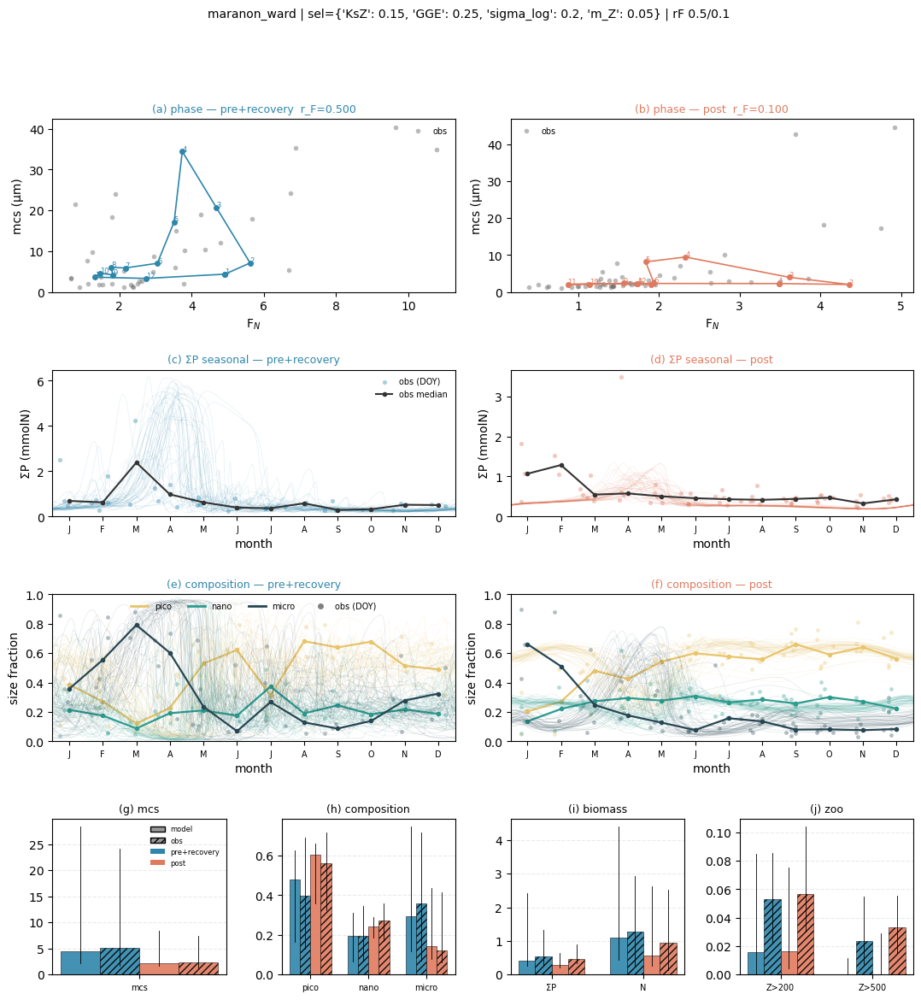


##### pre+recovery  r_F=0.55 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.45]
  grazing : KsZ 0.15  sigma_log 0.2  Q10 2.48
  scalars : GGE 0.33  growth-Q10 1.62  T_ref 20.0
  rates   : mP 0.0015  m_Z(quad) 0.1  m_Zlin 0.05  r_F 0.55
  detritus: k_remin 0.04  w_sink 5.0  ->  L = 125 m
  loss-fate routing (N / D / export):
     phyto mort : N 0.10 / D 0.90 / export 0.00
     graze unas : N 0.25 / D 0.75 / export 0.00
     zoo linear : N 0.10 / D 0.90 / export 0.00
     zoo quad   : N 0.10 / D 0.90 / export 0.00
     fish       : N 0.50 / D 0.25 / export 0.25
  forcing : n_harmonics 3  fit @ cruise DOY  | F_N[1.45-5.71]  d_e[30-54]  T[22.4-25.9]
  solver  : {'method': 'RK45', 'atol': 1e-09, 'rtol': 1e-06, 'max_step': 1.0, 'instability_neg_threshold': -0.001}

##### post  r_F=0.15 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-

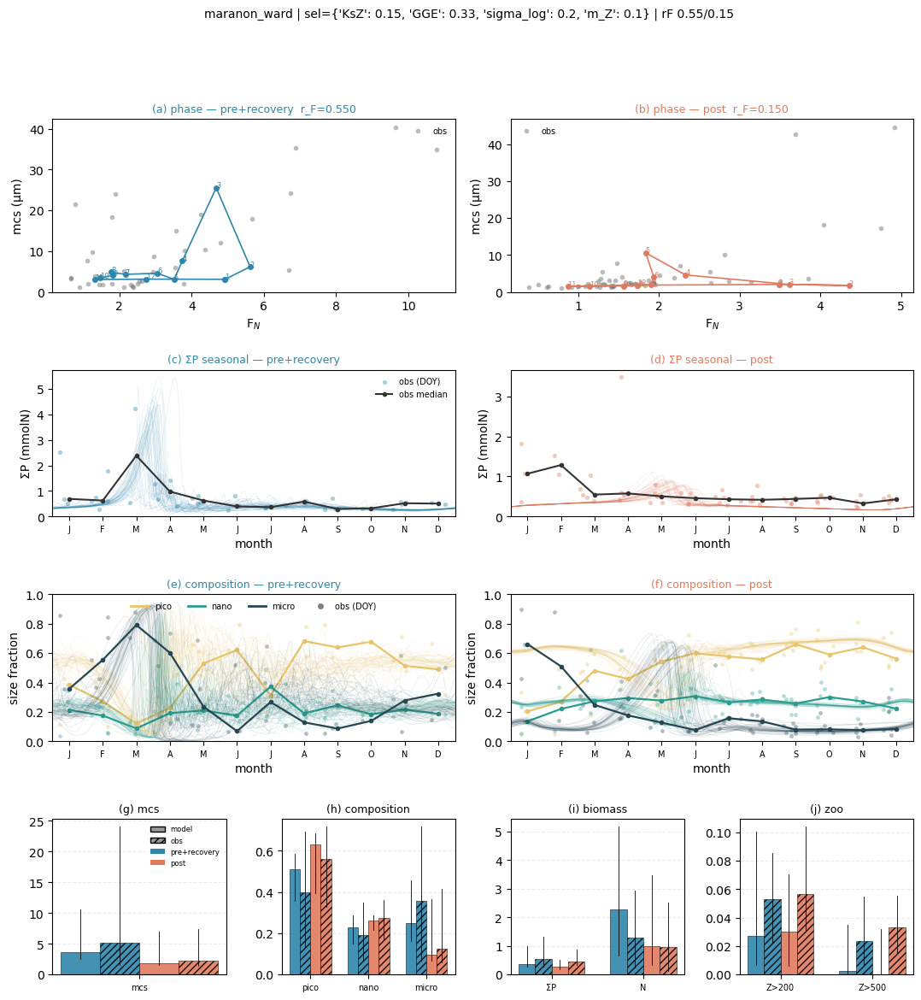


##### pre+recovery  r_F=0.6 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.45]
  grazing : KsZ 0.15  sigma_log 0.2  Q10 2.48
  scalars : GGE 0.33  growth-Q10 1.62  T_ref 20.0
  rates   : mP 0.0015  m_Z(quad) 0.2  m_Zlin 0.05  r_F 0.6
  detritus: k_remin 0.04  w_sink 5.0  ->  L = 125 m
  loss-fate routing (N / D / export):
     phyto mort : N 0.10 / D 0.90 / export 0.00
     graze unas : N 0.25 / D 0.75 / export 0.00
     zoo linear : N 0.10 / D 0.90 / export 0.00
     zoo quad   : N 0.10 / D 0.90 / export 0.00
     fish       : N 0.50 / D 0.25 / export 0.25
  forcing : n_harmonics 3  fit @ cruise DOY  | F_N[1.45-5.71]  d_e[30-54]  T[22.4-25.9]
  solver  : {'method': 'RK45', 'atol': 1e-09, 'rtol': 1e-06, 'max_step': 1.0, 'instability_neg_threshold': -0.001}

##### post  r_F=0.15 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10

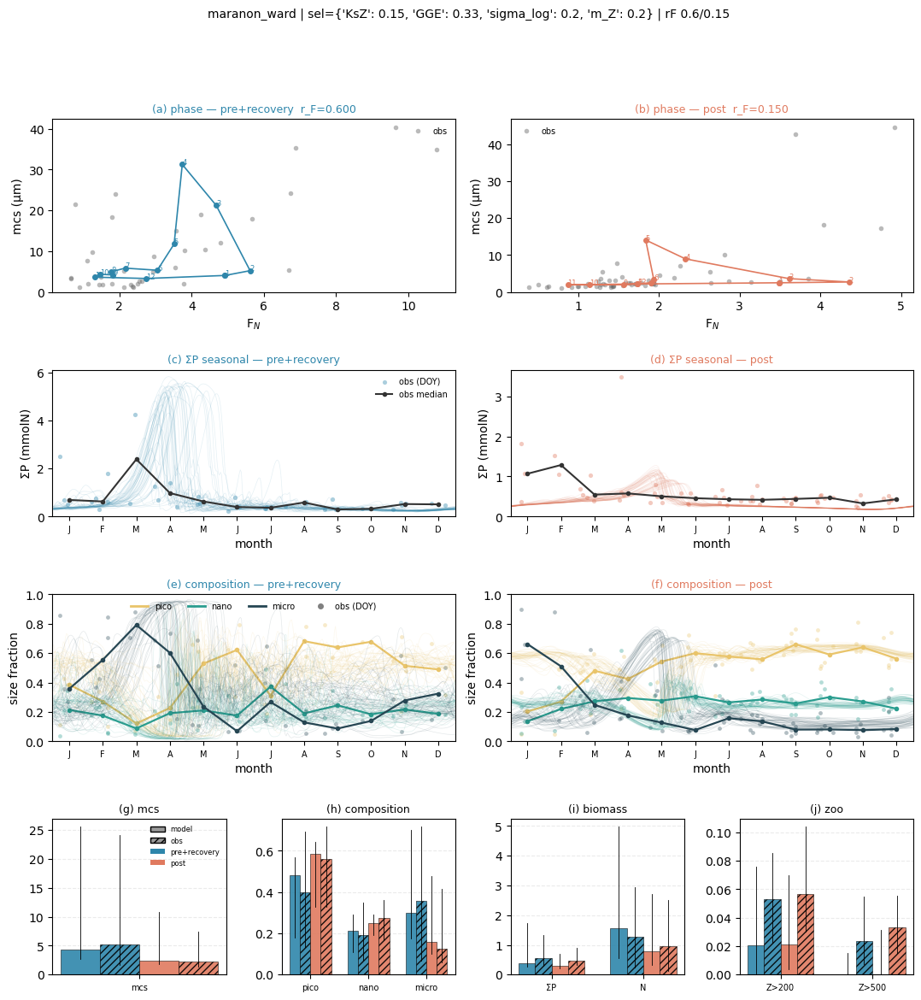

({'pre+recovery': {'t': array([0.0000e+00, 1.0000e+00, 2.0000e+00, ..., 2.1898e+04, 2.1899e+04,
          2.1900e+04], shape=(21901,)),
   'sumP': array([0.04      , 0.05305413, 0.07390223, ..., 0.30123208, 0.30525776,
          0.30918951], shape=(21901,)),
   'mcs': array([6.3       , 5.37058071, 4.80812726, ..., 1.48110493, 1.4720664 ,
          1.46482889], shape=(21901,)),
   'pico': array([0.3375    , 0.33560074, 0.32029687, ..., 0.67374141, 0.67627524,
          0.67842697], shape=(21901,)),
   'nano': array([0.325     , 0.39811781, 0.47677086, ..., 0.2812719 , 0.27886267,
          0.27669971], shape=(21901,)),
   'micro': array([0.3375    , 0.26628144, 0.20293227, ..., 0.04498669, 0.04486209,
          0.04487332], shape=(21901,)),
   'Z200': array([1.40000000e-02, 1.04456894e-02, 7.95881844e-03, ...,
          1.53969097e-08, 1.32231678e-08, 1.13723011e-08], shape=(21901,)),
   'Z500': array([8.00000000e-03, 5.56618749e-03, 3.98228123e-03, ...,
          1.52052048e-08, 1.305

In [7]:
# A — pre back to 0.50, GGE at the principled Stock value; inv≈obs
fig4_overview(RP, RQ, 0.50, 0.10, sel={'KsZ':0.15,'GGE':0.25,'sigma_log':0.20,'m_Z':0.05})  # inv .0040 joint .218 iaCV .212
# B — calmest with a near-target inv
fig4_overview(RP, RQ, 0.55, 0.15, sel={'KsZ':0.15,'GGE':0.33,'sigma_log':0.20,'m_Z':0.10})  # inv .0050 joint .293 iaCV .100
# C — best fit at a near-target inv (pre 0.60)
fig4_overview(RP, RQ, 0.60, 0.15, sel={'KsZ':0.15,'GGE':0.33,'sigma_log':0.20,'m_Z':0.20})  # inv .0051 joint .206 iaCV .145


##### pre+recovery  r_F=0.6 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.45]
  grazing : KsZ 0.23  sigma_log 0.2  Q10 2.48
  scalars : GGE 0.33  growth-Q10 1.62  T_ref 20.0
  rates   : mP 0.0015  m_Z(quad) 0.05  m_Zlin 0.05  r_F 0.6
  detritus: k_remin 0.04  w_sink 5.0  ->  L = 125 m
  loss-fate routing (N / D / export):
     phyto mort : N 0.10 / D 0.90 / export 0.00
     graze unas : N 0.25 / D 0.75 / export 0.00
     zoo linear : N 0.10 / D 0.90 / export 0.00
     zoo quad   : N 0.10 / D 0.90 / export 0.00
     fish       : N 0.50 / D 0.25 / export 0.25
  forcing : n_harmonics 3  fit @ cruise DOY  | F_N[1.45-5.71]  d_e[30-54]  T[22.4-25.9]
  solver  : {'method': 'RK45', 'atol': 1e-09, 'rtol': 1e-06, 'max_step': 1.0, 'instability_neg_threshold': -0.001}

##### post  r_F=0.15 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-1

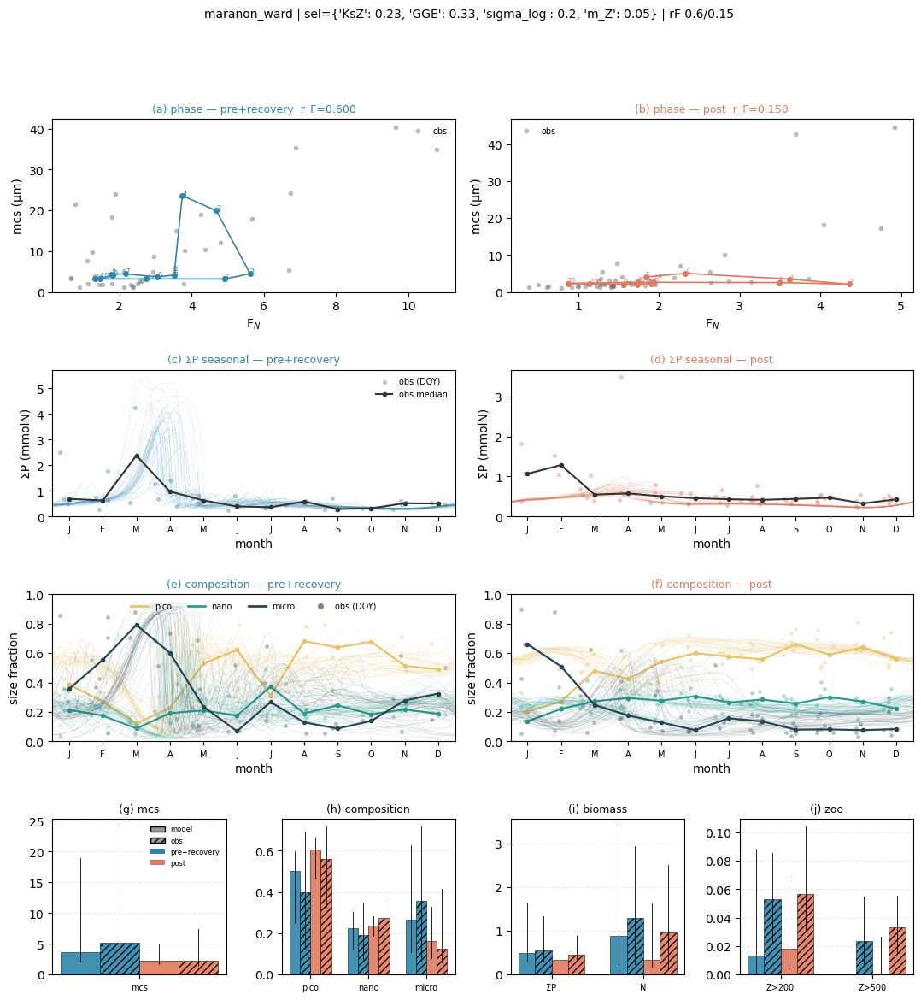

({'pre+recovery': {'t': array([0.0000e+00, 1.0000e+00, 2.0000e+00, ..., 2.1898e+04, 2.1899e+04,
          2.1900e+04], shape=(21901,)),
   'sumP': array([0.04      , 0.05344578, 0.07522912, ..., 0.43603109, 0.43726181,
          0.43845537], shape=(21901,)),
   'mcs': array([6.3       , 5.34729726, 4.76875778, ..., 3.31912271, 3.28267469,
          3.24612637], shape=(21901,)),
   'pico': array([0.3375    , 0.336161  , 0.32117967, ..., 0.51391069, 0.51646799,
          0.51897867], shape=(21901,)),
   'nano': array([0.325     , 0.39888422, 0.47857595, ..., 0.25049587, 0.25017672,
          0.25001778], shape=(21901,)),
   'micro': array([0.3375    , 0.26495478, 0.20024438, ..., 0.23559345, 0.23335529,
          0.23100355], shape=(21901,)),
   'Z200': array([0.014     , 0.01048595, 0.00801206, ..., 0.0186072 , 0.01978853,
          0.02095032], shape=(21901,)),
   'Z500': array([8.00000000e-03, 5.59034433e-03, 4.01397481e-03, ...,
          1.16900719e-11, 1.06898699e-11, 9.81781774e-1

In [8]:
fig4_overview(RP, RQ, 0.60, 0.15, sel={'KsZ':0.23,'GGE':0.33,'sigma_log':0.20,'m_Z':0.05})

In [9]:
import numpy as np, pandas as pd, seasonal_scan_harness as ssh
from collections import defaultdict
RP = ssh.load_results('seasonal_grid_pre_2026-06-29.pkl')
RQ = ssh.load_results('seasonal_grid_post_2026-06-29.pkl')
OBS = {'pre+recovery':RP.obs['pre+recovery'], 'post':RQ.obs['post']}
CK=['KsZ','GGE','sigma_log','m_Z']; K5=['mcs','pico','nano','micro','sumP']; W5={k:1. for k in K5}
MOS=['J','F','M','A','M','J','J','A','S','O','N','D']
def fit5(r,g): return float(np.nanmax([ssh.score({k:r.get(k+'_med',np.nan) for k in K5},OBS[g]['med'],W5),
                                       ssh.score({k:r.get(k,np.nan)        for k in K5},OBS[g]['mean'],W5)]))
def iacv(r): return r.get('sumP_sd',np.nan)/max(r.get('sumP',np.nan),1e-9)
def bl(r):
    cz=np.asarray(r.get('clim_sumP',[np.nan]*12),float)
    return MOS[int(np.nanargmax(cz))] if np.isfinite(cz).any() else '.'
def ckey(r): return tuple(round(r[k],4) for k in CK)
o={k:(OBS['pre+recovery']['med'][k],OBS['post']['med'][k]) for k in ['N','micro','Z200']}
Qby=defaultdict(list)
for q in RQ.records: Qby[ckey(q)].append(q)
rows=[]
for p in RP.records:
    if p.get('has_nan'): continue
    for q in Qby.get(ckey(p),[]):
        if q.get('has_nan') or q['fish']>p['fish']+1e-9: continue
        inv=q['Z200_med']-p['Z200_med']
        row={k:v for k,v in zip(CK,ckey(p))}
        row.update(rFpre=round(p['fish'],2), rFpost=round(q['fish'],2),
            joint=round(max(fit5(p,'pre+recovery'),fit5(q,'post')),3), inv=round(inv,4),
            Zpre=round(p['Z200_med'],4), Zpost=round(q['Z200_med'],4),       # obs pre .053 / post .057
            Npre=round(p['N_med'],2), Npost=round(q['N_med'],2),             # obs N below
            micPre=round(p['micro_med'],2), micPost=round(q['micro_med'],2), # obs micro below
            cvPre=round(p['cv_sumP'],2), iaPre=round(iacv(p),3), blPre=bl(p), blPost=bl(q))
        rows.append(row)
X=pd.DataFrame(rows)
print(f"OBS  N {o['N'][0]:.2f}/{o['N'][1]:.2f} | micro {o['micro'][0]:.2f}/{o['micro'][1]:.2f} | "
      f"Z200 {o['Z200'][0]:.3f}/{o['Z200'][1]:.3f}  (pre/post)\n")
near=X[(X.inv>=0.0030)&(X.inv<=0.0060)]
print(f"=== near-target inv [.0030-.0060], by joint ({len(near)} pairs) — read Zpost (visibility), N, micro, cv ===")
print(near.sort_values('joint').head(25).to_string(index=False))

OBS  N 1.29/0.96 | micro 0.36/0.12 | Z200 0.053/0.057  (pre/post)

=== near-target inv [.0030-.0060], by joint (323 pairs) — read Zpost (visibility), N, micro, cv ===
 KsZ  GGE  sigma_log  m_Z  rFpre  rFpost  joint    inv   Zpre  Zpost  Npre  Npost  micPre  micPost  cvPre  iaPre blPre blPost
0.15 0.33       0.20 0.20   0.60    0.15  0.206 0.0051 0.0167 0.0218  1.44   0.72    0.30     0.15   1.46  0.145     A      M
0.15 0.33       0.20 0.20   0.65    0.15  0.206 0.0037 0.0181 0.0218  1.61   0.72    0.29     0.15   1.48  0.218     M      M
0.15 0.25       0.20 0.05   0.60    0.10  0.211 0.0032 0.0129 0.0161  1.04   0.57    0.30     0.14   1.49  0.311     M      A
0.15 0.25       0.20 0.05   0.50    0.10  0.218 0.0040 0.0121 0.0161  1.03   0.57    0.28     0.14   1.36  0.212     A      A
0.15 0.33       0.20 0.20   0.65    0.10  0.219 0.0051 0.0181 0.0232  1.61   0.73    0.29     0.11   1.48  0.218     M      A
0.15 0.31       0.20 0.10   0.60    0.20  0.224 0.0033 0.0177 0.0210  1.53   


##### pre+recovery  r_F=0.6 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.45]
  grazing : KsZ 0.15  sigma_log 0.25  Q10 2.48
  scalars : GGE 0.25  growth-Q10 1.62  T_ref 20.0
  rates   : mP 0.0015  m_Z(quad) 0.05  m_Zlin 0.05  r_F 0.6
  detritus: k_remin 0.04  w_sink 5.0  ->  L = 125 m
  loss-fate routing (N / D / export):
     phyto mort : N 0.10 / D 0.90 / export 0.00
     graze unas : N 0.25 / D 0.75 / export 0.00
     zoo linear : N 0.10 / D 0.90 / export 0.00
     zoo quad   : N 0.10 / D 0.90 / export 0.00
     fish       : N 0.50 / D 0.25 / export 0.25
  forcing : n_harmonics 3  fit @ cruise DOY  | F_N[1.45-5.71]  d_e[30-54]  T[22.4-25.9]
  solver  : {'method': 'RK45', 'atol': 1e-09, 'rtol': 1e-06, 'max_step': 1.0, 'instability_neg_threshold': -0.001}

##### post  r_F=0.1 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-1

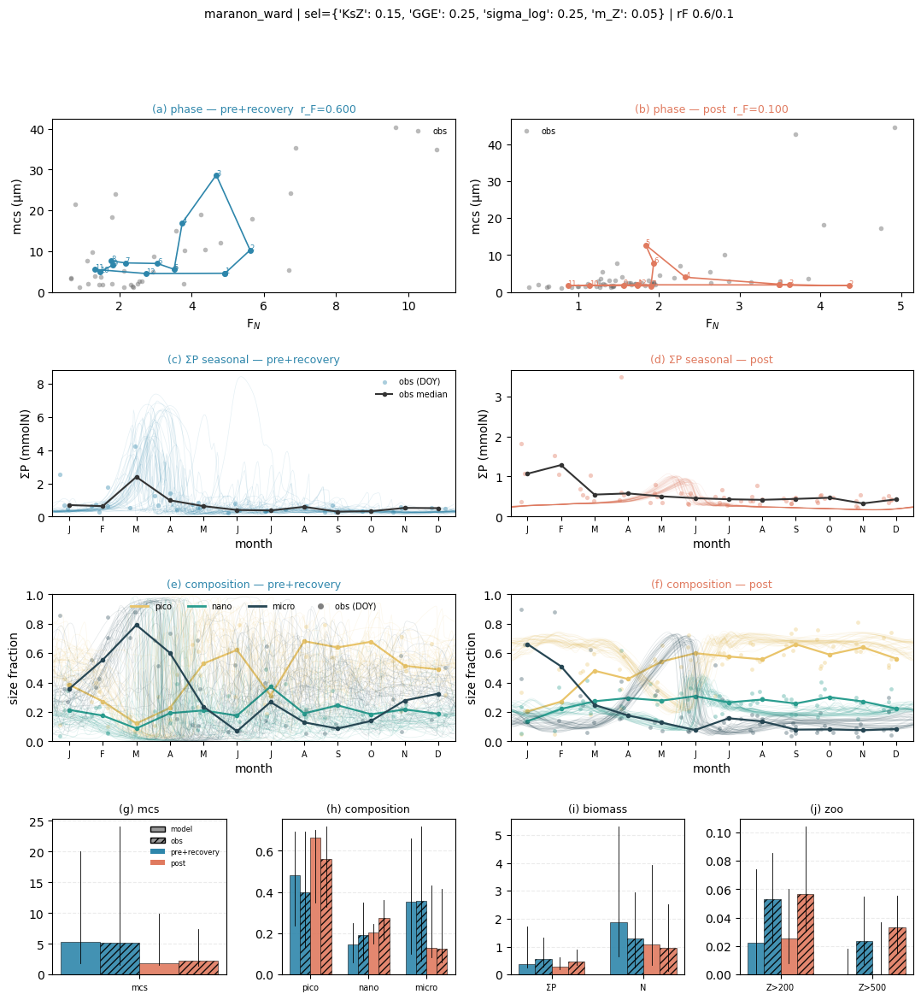

({'pre+recovery': {'t': array([0.0000e+00, 1.0000e+00, 2.0000e+00, ..., 2.1898e+04, 2.1899e+04,
          2.1900e+04], shape=(21901,)),
   'sumP': array([0.04      , 0.05268727, 0.07268668, ..., 0.22180944, 0.21861495,
          0.21893194], shape=(21901,)),
   'mcs': array([6.3       , 5.3925852 , 4.8457256 , ..., 3.40363628, 3.82553175,
          4.24934176], shape=(21901,)),
   'pico': array([0.3375    , 0.33504907, 0.31936539, ..., 0.56004548, 0.52669043,
          0.49532385], shape=(21901,)),
   'nano': array([0.325     , 0.39744539, 0.47525095, ..., 0.14730645, 0.16326788,
          0.18037119], shape=(21901,)),
   'micro': array([0.3375    , 0.26750554, 0.20538366, ..., 0.29264807, 0.31004169,
          0.32430496], shape=(21901,)),
   'Z200': array([0.014     , 0.0105082 , 0.00804978, ..., 0.01577688, 0.01534501,
          0.01518592], shape=(21901,)),
   'Z500': array([8.00000000e-03, 5.59917323e-03, 4.02680509e-03, ...,
          1.01023699e-10, 9.37457255e-11, 8.71784806e-1

In [10]:
fig4_overview(RP, RQ, 0.60, 0.10, sel={'KsZ':0.15,'GGE':0.25,'sigma_log':0.25,'m_Z':0.05})

In [11]:
import numpy as np, pandas as pd, seasonal_scan_harness as ssh
from collections import defaultdict
RP = ssh.load_results('seasonal_grid_pre_2026-06-29.pkl')
RQ = ssh.load_results('seasonal_grid_post_2026-06-29.pkl')
OBS = {'pre+recovery':RP.obs['pre+recovery'], 'post':RQ.obs['post']}
CK=['KsZ','GGE','sigma_log','m_Z']; K5=['mcs','pico','nano','micro','sumP']; W5={k:1. for k in K5}
MOS=['J','F','M','A','M','J','J','A','S','O','N','D']
def fit5(r,g): return float(np.nanmax([ssh.score({k:r.get(k+'_med',np.nan) for k in K5},OBS[g]['med'],W5),
                                       ssh.score({k:r.get(k,np.nan)        for k in K5},OBS[g]['mean'],W5)]))
def iacv(r): return r.get('sumP_sd',np.nan)/max(r.get('sumP',np.nan),1e-9)
def bl(r):
    cz=np.asarray(r.get('clim_sumP',[np.nan]*12),float)
    return MOS[int(np.nanargmax(cz))] if np.isfinite(cz).any() else '.'
def ck(r): return tuple(round(r[k],4) for k in CK)

# --- your eyeball filters (tweak freely) ---
KSZ=0.23          # preferred (Dutkiewicz 2020; robust, calm)
MAXCV=1.40        # stability ceiling (your pick = 1.09); lower = calmer only
INV_MIN=0.0030    # cascade direction present
NPRE_MAX=1.40     # pre N must not overshoot obs (obs pre N = 1.29)

oN=(OBS['pre+recovery']['med']['N'],OBS['post']['med']['N'])
oMic=(OBS['pre+recovery']['med']['micro'],OBS['post']['med']['micro'])
oZ=(OBS['pre+recovery']['med']['Z200'],OBS['post']['med']['Z200'])
Qby=defaultdict(list)
for q in RQ.records: Qby[ck(q)].append(q)
rows=[]
for p in RP.records:
    if p.get('has_nan') or round(p['KsZ'],4)!=KSZ: continue
    for q in Qby.get(ck(p),[]):
        if q.get('has_nan') or q['fish']>p['fish']+1e-9: continue
        inv=q['Z200_med']-p['Z200_med']
        if inv<INV_MIN or p['cv_sumP']>MAXCV or p['N_med']>NPRE_MAX: continue
        rows.append(dict(GGE=round(p['GGE'],3), sig=round(p['sigma_log'],3), m_Z=round(p['m_Z'],3),
            rFpre=round(p['fish'],2), rFpost=round(q['fish'],2),
            joint=round(max(fit5(p,'pre+recovery'),fit5(q,'post')),3), inv=round(inv,4),
            Zpre=round(p['Z200_med'],4), Zpost=round(q['Z200_med'],4),
            Npre=round(p['N_med'],2), Npost=round(q['N_med'],2),
            micPre=round(p['micro_med'],2), micPost=round(q['micro_med'],2),
            cvPre=round(p['cv_sumP'],2), iaPre=round(iacv(p),3), blPre=bl(p), blPost=bl(q)))
X=pd.DataFrame(rows).sort_values(['cvPre','joint'])
print(f"OBS  N {oN[0]:.2f}/{oN[1]:.2f} | micro {oMic[0]:.2f}/{oMic[1]:.2f} | Z200 {oZ[0]:.3f}/{oZ[1]:.3f}  (pre/post)")
print(f"KsZ={KSZ}, cv<={MAXCV}, inv>={INV_MIN}, preN<={NPRE_MAX} -> {len(X)} candidates, calmest first\n")
print(X.to_string(index=False))

OBS  N 1.29/0.96 | micro 0.36/0.12 | Z200 0.053/0.057  (pre/post)
KsZ=0.23, cv<=1.4, inv>=0.003, preN<=1.4 -> 152 candidates, calmest first

 GGE  sig  m_Z  rFpre  rFpost  joint    inv   Zpre  Zpost  Npre  Npost  micPre  micPost  cvPre  iaPre blPre blPost
0.25 0.15 0.20   0.60    0.15  0.712 0.0033 0.0035 0.0067  0.25   0.14    0.33     0.29   0.71  0.173     A      M
0.31 0.15 0.20   0.50    0.10  0.755 0.0044 0.0075 0.0119  0.34   0.17    0.28     0.30   0.71  0.091     A      M
0.25 0.15 0.20   0.60    0.20  0.771 0.0036 0.0035 0.0070  0.25   0.14    0.33     0.29   0.71  0.173     A      M
0.25 0.15 0.20   0.60    0.10  0.775 0.0051 0.0035 0.0086  0.25   0.14    0.33     0.30   0.71  0.173     A      M
0.25 0.15 0.05   0.40    0.10  0.557 0.0032 0.0071 0.0104  0.34   0.17    0.25     0.26   0.74  0.091     A      M
0.25 0.15 0.05   0.50    0.10  0.557 0.0034 0.0070 0.0104  0.33   0.17    0.30     0.26   0.74  0.147     A      M
0.25 0.15 0.20   0.50    0.15  0.712 0.0031 0.0036 0.0


##### pre+recovery  r_F=0.6 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.45]
  grazing : KsZ 0.23  sigma_log 0.25  Q10 2.48
  scalars : GGE 0.33  growth-Q10 1.62  T_ref 20.0
  rates   : mP 0.0015  m_Z(quad) 0.2  m_Zlin 0.05  r_F 0.6
  detritus: k_remin 0.04  w_sink 5.0  ->  L = 125 m
  loss-fate routing (N / D / export):
     phyto mort : N 0.10 / D 0.90 / export 0.00
     graze unas : N 0.25 / D 0.75 / export 0.00
     zoo linear : N 0.10 / D 0.90 / export 0.00
     zoo quad   : N 0.10 / D 0.90 / export 0.00
     fish       : N 0.50 / D 0.25 / export 0.25
  forcing : n_harmonics 3  fit @ cruise DOY  | F_N[1.45-5.71]  d_e[30-54]  T[22.4-25.9]
  solver  : {'method': 'RK45', 'atol': 1e-09, 'rtol': 1e-06, 'max_step': 1.0, 'instability_neg_threshold': -0.001}

##### post  r_F=0.15 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-1

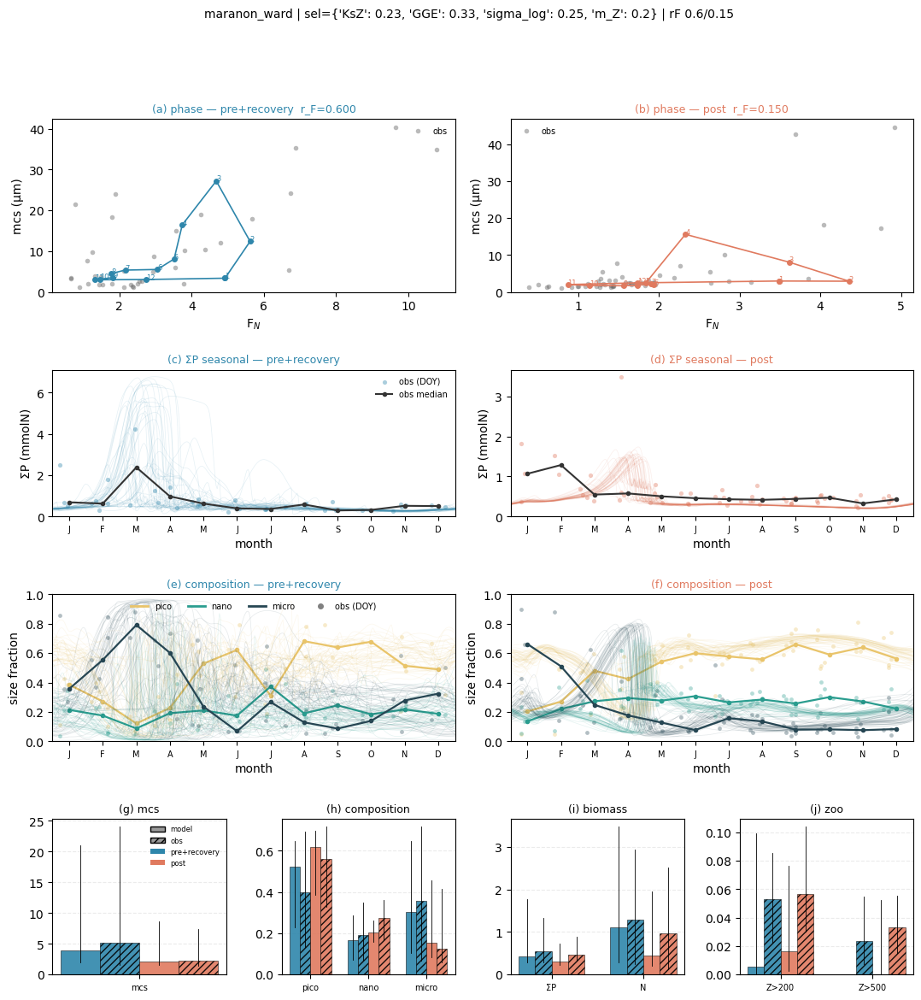

({'pre+recovery': {'t': array([0.0000e+00, 1.0000e+00, 2.0000e+00, ..., 2.1898e+04, 2.1899e+04,
          2.1900e+04], shape=(21901,)),
   'sumP': array([0.04      , 0.05328743, 0.07469283, ..., 0.38862488, 0.39093657,
          0.39330074], shape=(21901,)),
   'mcs': array([6.3       , 5.35672985, 4.78501916, ..., 2.99373594, 2.97183921,
          2.95950921], shape=(21901,)),
   'pico': array([0.3375    , 0.33591977, 0.32075476, ..., 0.59155327, 0.59410757,
          0.59601696], shape=(21901,)),
   'nano': array([0.325     , 0.39860126, 0.47794736, ..., 0.14002051, 0.1381001 ,
          0.13608693], shape=(21901,)),
   'micro': array([0.3375    , 0.26547897, 0.20129789, ..., 0.26842621, 0.26779233,
          0.26789611], shape=(21901,)),
   'Z200': array([0.014     , 0.0104349 , 0.00794114, ..., 0.02442753, 0.02490213,
          0.02534066], shape=(21901,)),
   'Z500': array([8.00000000e-03, 5.56203999e-03, 3.97636240e-03, ...,
          1.57207743e-57, 1.36306435e-57, 1.18678869e-5

In [12]:
fig4_overview(RP, RQ, 0.60, 0.15, sel={'KsZ':0.23,'GGE':0.33,'sigma_log':0.25,'m_Z':0.20})  # joint .238, Npre 1.02, micro .29→.15, blPre Mar, cv 1.33
# pre-0.65 variant is a touch better-fit and calmer if 0.65 is acceptable: joint .222, cv 1.24

In [13]:
import numpy as np, pandas as pd, seasonal_scan_harness as ssh
from collections import defaultdict
RP = ssh.load_results('seasonal_grid_pre_2026-06-29.pkl')
RQ = ssh.load_results('seasonal_grid_post_2026-06-29.pkl')
oP, oQ = RP.obs['pre+recovery']['med'], RQ.obs['post']['med']
CK=['KsZ','GGE','sigma_log','m_Z']
def ck(r): return tuple(round(r[k],4) for k in CK)
def bloom(r):
    cz=np.asarray(r.get('clim_sumP',[np.nan]*12),float)
    return int(np.nanargmax(cz))+1 if np.isfinite(cz).any() else 0
def comp_e(r,o):
    ks=['mcs','pico','nano','micro']; e=[(r.get(k+'_med',np.nan)-o[k])/o[k] for k in ks if o.get(k)]
    return float(np.sqrt(np.nanmean(np.square(e))))
def rs(a,b): return (a-b)/a if abs(a)>1e-9 else np.nan
Qby=defaultdict(list)
for q in RQ.records: Qby[ck(q)].append(q)
rows=[]
for p in RP.records:
    if p.get('has_nan'): continue
    for q in Qby.get(ck(p),[]):
        if q.get('has_nan') or q['fish']>p['fish']+1e-9: continue
        rows.append(dict(KsZ=p['KsZ'],GGE=p['GGE'],sig=p['sigma_log'],mZ=p['m_Z'],
            rFpre=round(p['fish'],2),rFpost=round(q['fish'],2),
            iaCV=round(p['sumP_sd']/max(p['sumP'],1e-9),3),
            blPre=bloom(p), blPost=bloom(q),
            comp=round(max(comp_e(p,oP),comp_e(q,oQ)),3),
            shP=round(abs(rs(p['sumP_med'],q['sumP_med'])-rs(oP['sumP'],oQ['sumP'])),3),
            shN=round(abs(rs(p['N_med'],q['N_med'])-rs(oP['N'],oQ['N'])),3),
            Zrat=round(q['Z200_med']/max(p['Z200_med'],1e-9),2),
            inv=round(q['Z200_med']-p['Z200_med'],4)))
X=pd.DataFrame(rows)
print(f"OBS med  mcs {oP['mcs']:.1f}/{oQ['mcs']:.1f}  micro {oP['micro']:.2f}/{oQ['micro']:.2f}  "
      f"sumP {oP['sumP']:.2f}/{oQ['sumP']:.2f}  N {oP['N']:.2f}/{oQ['N']:.2f}  Z200 {oP['Z200']:.3f}/{oQ['Z200']:.3f}")
print(f"obs relshift  sumP {rs(oP['sumP'],oQ['sumP']):.2f}  N {rs(oP['N'],oQ['N']):.2f}   | {len(X)} stable pairs")
def call(r): return (f"fig4_overview(RP,RQ,{r.rFpre},{r.rFpost},"
                     f"sel={{'KsZ':{r.KsZ},'GGE':{r.GGE},'sigma_log':{r.sig},'m_Z':{r.mZ}}})")
for m,desc in [('iaCV','HIGH=squiggle, LOW=clean'),
               ('comp','LOW=matches obs bars, HIGH=off'),
               ('shP','LOW=matches obs ΣP shift'),
               ('shN','LOW=matches obs N shift'),
               ('Zrat','~1.3-2 visible, <1.1 invisible, >2.5 overshoot')]:
    s=X.sort_values(m)
    print(f"\n### {m} — {desc}")
    for lbl,r in [('LOW ',s.iloc[0]),('HIGH',s.iloc[-1])]:
        print(f"  {lbl} {m}={getattr(r,m):<6} | comp {r.comp} iaCV {r.iaCV} inv {r.inv} bl {r.blPre}/{r.blPost}\n       {call(r)}")

OBS med  mcs 5.1/2.3  micro 0.36/0.12  sumP 0.55/0.46  N 1.29/0.96  Z200 0.053/0.057
obs relshift  sumP 0.17  N 0.25   | 1458 stable pairs

### iaCV — HIGH=squiggle, LOW=clean
  LOW  iaCV=0.001  | comp 0.179 iaCV 0.001 inv -0.018 bl 2.0/5.0
       fig4_overview(RP,RQ,0.55,0.15,sel={'KsZ':0.15,'GGE':0.33,'sigma_log':0.25,'m_Z':0.1})
  HIGH iaCV=0.379  | comp 0.497 iaCV 0.379 inv 0.0093 bl 3.0/4.0
       fig4_overview(RP,RQ,0.65,0.1,sel={'KsZ':0.23,'GGE':0.25,'sigma_log':0.25,'m_Z':0.2})

### comp — LOW=matches obs bars, HIGH=off
  LOW  comp=0.114  | comp 0.114 iaCV 0.253 inv 0.0032 bl 4.0/4.0
       fig4_overview(RP,RQ,0.65,0.1,sel={'KsZ':0.15,'GGE':0.25,'sigma_log':0.2,'m_Z':0.05})
  HIGH comp=0.976  | comp 0.976 iaCV 0.103 inv 0.0012 bl 2.0/2.0
       fig4_overview(RP,RQ,0.6,0.2,sel={'KsZ':0.45,'GGE':0.25,'sigma_log':0.25,'m_Z':0.2})

### shP — LOW=matches obs ΣP shift
  LOW  shP=0.0    | comp 0.642 iaCV 0.066 inv 0.0041 bl 3.0/2.0
       fig4_overview(RP,RQ,0.65,0.2,sel={'KsZ':0.45,'


##### pre+recovery  r_F=0.55 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.45]
  grazing : KsZ 0.15  sigma_log 0.25  Q10 2.48
  scalars : GGE 0.33  growth-Q10 1.62  T_ref 20.0
  rates   : mP 0.0015  m_Z(quad) 0.1  m_Zlin 0.05  r_F 0.55
  detritus: k_remin 0.04  w_sink 5.0  ->  L = 125 m
  loss-fate routing (N / D / export):
     phyto mort : N 0.10 / D 0.90 / export 0.00
     graze unas : N 0.25 / D 0.75 / export 0.00
     zoo linear : N 0.10 / D 0.90 / export 0.00
     zoo quad   : N 0.10 / D 0.90 / export 0.00
     fish       : N 0.50 / D 0.25 / export 0.25
  forcing : n_harmonics 3  fit @ cruise DOY  | F_N[1.45-5.71]  d_e[30-54]  T[22.4-25.9]
  solver  : {'method': 'RK45', 'atol': 1e-09, 'rtol': 1e-06, 'max_step': 1.0, 'instability_neg_threshold': -0.001}

##### post  r_F=0.15 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04

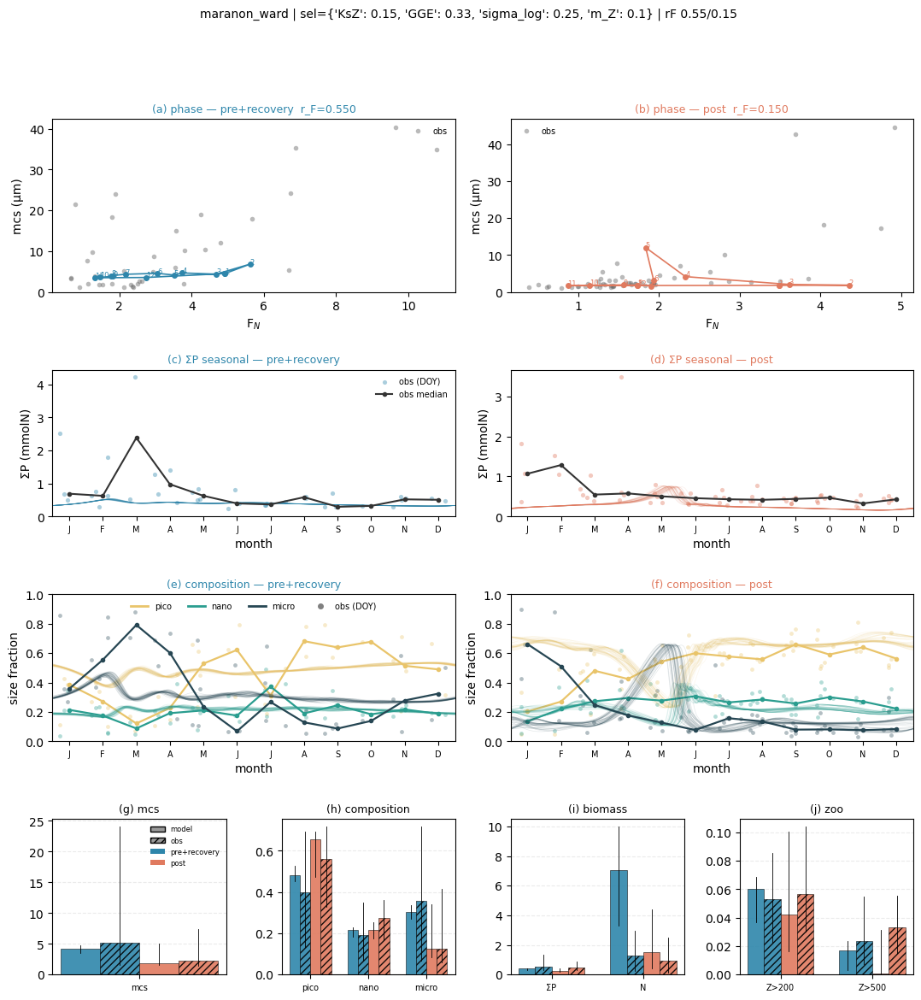


##### pre+recovery  r_F=0.65 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.45]
  grazing : KsZ 0.23  sigma_log 0.25  Q10 2.48
  scalars : GGE 0.25  growth-Q10 1.62  T_ref 20.0
  rates   : mP 0.0015  m_Z(quad) 0.2  m_Zlin 0.05  r_F 0.65
  detritus: k_remin 0.04  w_sink 5.0  ->  L = 125 m
  loss-fate routing (N / D / export):
     phyto mort : N 0.10 / D 0.90 / export 0.00
     graze unas : N 0.25 / D 0.75 / export 0.00
     zoo linear : N 0.10 / D 0.90 / export 0.00
     zoo quad   : N 0.10 / D 0.90 / export 0.00
     fish       : N 0.50 / D 0.25 / export 0.25
  forcing : n_harmonics 3  fit @ cruise DOY  | F_N[1.45-5.71]  d_e[30-54]  T[22.4-25.9]
  solver  : {'method': 'RK45', 'atol': 1e-09, 'rtol': 1e-06, 'max_step': 1.0, 'instability_neg_threshold': -0.001}

##### post  r_F=0.1 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-

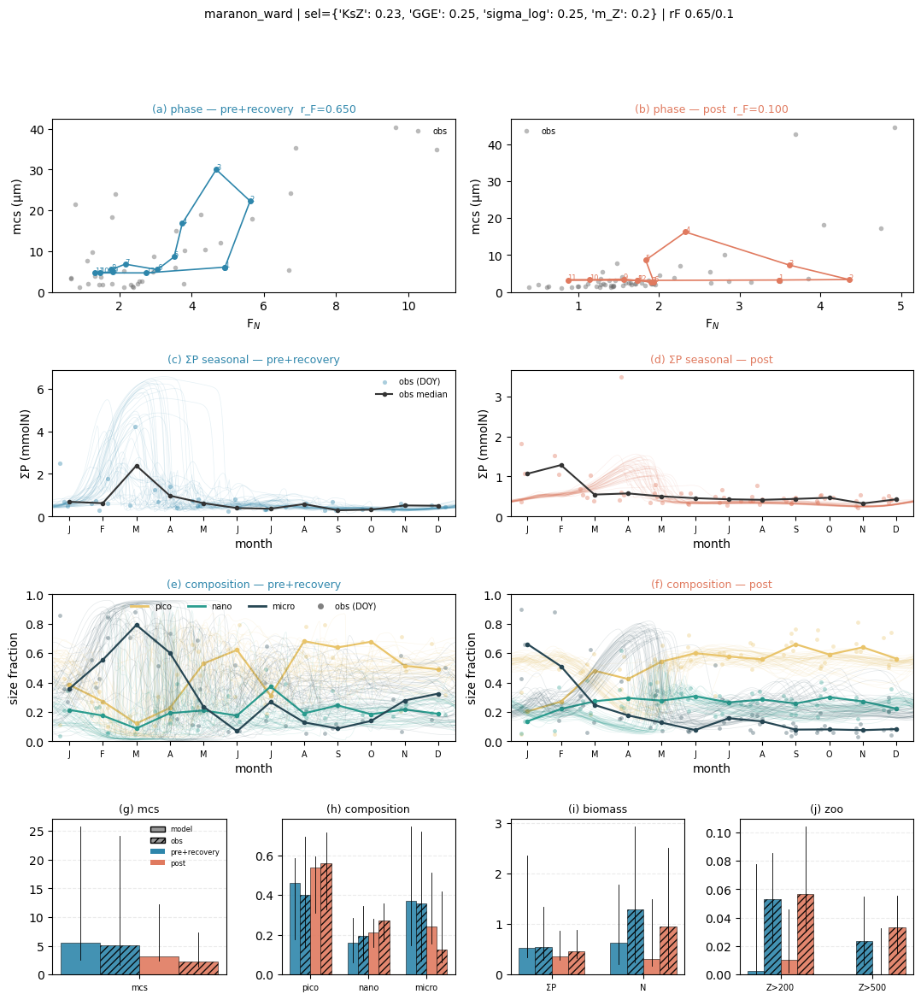

({'pre+recovery': {'t': array([0.0000e+00, 1.0000e+00, 2.0000e+00, ..., 2.1898e+04, 2.1899e+04,
          2.1900e+04], shape=(21901,)),
   'sumP': array([0.04      , 0.05321839, 0.0745353 , ..., 0.44083945, 0.44808438,
          0.45311477], shape=(21901,)),
   'mcs': array([6.3       , 5.34803804, 4.77374121, ..., 2.88175042, 2.80970958,
          2.73364283], shape=(21901,)),
   'pico': array([0.3375    , 0.33614845, 0.32105467, ..., 0.54723328, 0.55866001,
          0.57057883], shape=(21901,)),
   'nano': array([0.325     , 0.39884915, 0.47837235, ..., 0.24521763, 0.2333591 ,
          0.22144111], shape=(21901,)),
   'micro': array([0.3375    , 0.26500239, 0.20057299, ..., 0.20754909, 0.20798089,
          0.20798005], shape=(21901,)),
   'Z200': array([1.40000000e-02, 1.02344312e-02, 7.66092207e-03, ...,
          4.71021128e-08, 4.73304473e-08, 4.74940718e-08], shape=(21901,)),
   'Z500': array([0.008     , 0.00542656, 0.00380126, ..., 0.        , 0.        ,
          0.       

In [14]:
fig4_overview(RP,RQ,0.55,0.15,sel={'KsZ':0.15,'GGE':0.33,'sigma_log':0.25,'m_Z':0.1})
fig4_overview(RP,RQ,0.65,0.1,sel={'KsZ':0.23,'GGE':0.25,'sigma_log':0.25,'m_Z':0.2})


##### pre+recovery  r_F=0.65 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.45]
  grazing : KsZ 0.15  sigma_log 0.2  Q10 2.48
  scalars : GGE 0.25  growth-Q10 1.62  T_ref 20.0
  rates   : mP 0.0015  m_Z(quad) 0.05  m_Zlin 0.05  r_F 0.65
  detritus: k_remin 0.04  w_sink 5.0  ->  L = 125 m
  loss-fate routing (N / D / export):
     phyto mort : N 0.10 / D 0.90 / export 0.00
     graze unas : N 0.25 / D 0.75 / export 0.00
     zoo linear : N 0.10 / D 0.90 / export 0.00
     zoo quad   : N 0.10 / D 0.90 / export 0.00
     fish       : N 0.50 / D 0.25 / export 0.25
  forcing : n_harmonics 3  fit @ cruise DOY  | F_N[1.45-5.71]  d_e[30-54]  T[22.4-25.9]
  solver  : {'method': 'RK45', 'atol': 1e-09, 'rtol': 1e-06, 'max_step': 1.0, 'instability_neg_threshold': -0.001}

##### post  r_F=0.1 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-

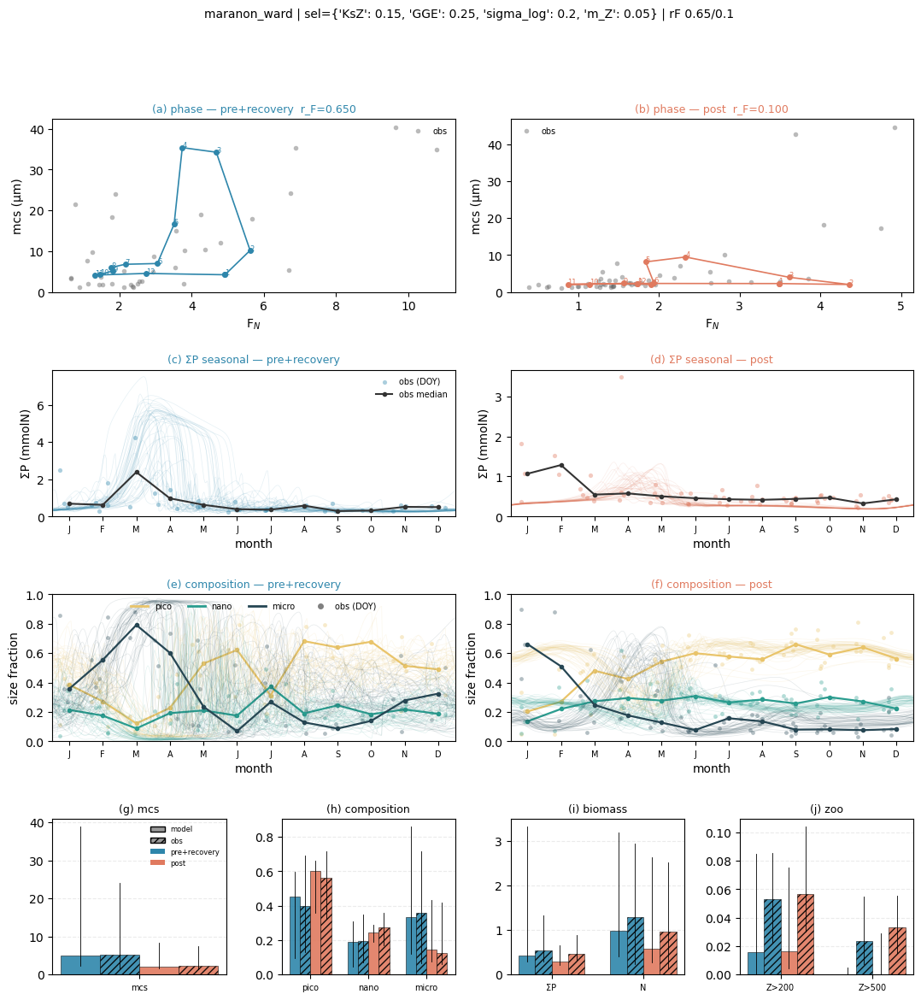


##### pre+recovery  r_F=0.6 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.45]
  grazing : KsZ 0.45  sigma_log 0.25  Q10 2.48
  scalars : GGE 0.25  growth-Q10 1.62  T_ref 20.0
  rates   : mP 0.0015  m_Z(quad) 0.2  m_Zlin 0.05  r_F 0.6
  detritus: k_remin 0.04  w_sink 5.0  ->  L = 125 m
  loss-fate routing (N / D / export):
     phyto mort : N 0.10 / D 0.90 / export 0.00
     graze unas : N 0.25 / D 0.75 / export 0.00
     zoo linear : N 0.10 / D 0.90 / export 0.00
     zoo quad   : N 0.10 / D 0.90 / export 0.00
     fish       : N 0.50 / D 0.25 / export 0.25
  forcing : n_harmonics 3  fit @ cruise DOY  | F_N[1.45-5.71]  d_e[30-54]  T[22.4-25.9]
  solver  : {'method': 'RK45', 'atol': 1e-09, 'rtol': 1e-06, 'max_step': 1.0, 'instability_neg_threshold': -0.001}

##### post  r_F=0.2 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10

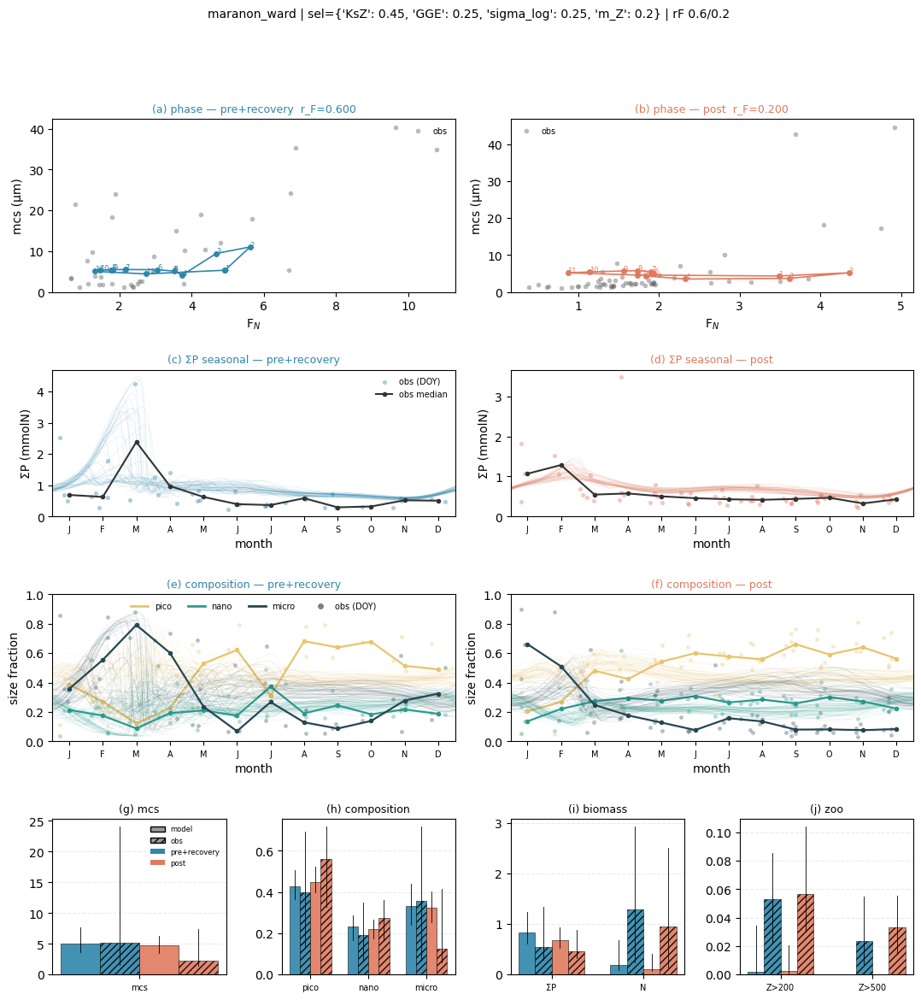

({'pre+recovery': {'t': array([0.0000e+00, 1.0000e+00, 2.0000e+00, ..., 2.1898e+04, 2.1899e+04,
          2.1900e+04], shape=(21901,)),
   'sumP': array([0.04      , 0.05362294, 0.07584457, ..., 0.85369616, 0.86220245,
          0.87106421], shape=(21901,)),
   'mcs': array([6.3       , 5.33685921, 4.75091099, ..., 3.4824177 , 3.46934062,
          3.46072905], shape=(21901,)),
   'pico': array([0.3375    , 0.33641011, 0.32157622, ..., 0.49209064, 0.49522926,
          0.49807437], shape=(21901,)),
   'nano': array([0.325     , 0.39923458, 0.47941121, ..., 0.27327841, 0.26863509,
          0.26402421], shape=(21901,)),
   'micro': array([0.3375    , 0.26435531, 0.19901257, ..., 0.23463095, 0.23613565,
          0.23790142], shape=(21901,)),
   'Z200': array([1.40000000e-02, 1.04184495e-02, 7.91387909e-03, ...,
          8.32748830e-09, 7.68608787e-09, 7.11245346e-09], shape=(21901,)),
   'Z500': array([0.008     , 0.0055558 , 0.00396743, ..., 0.        , 0.        ,
          0.       

In [15]:
fig4_overview(RP,RQ,0.65,0.1,sel={'KsZ':0.15,'GGE':0.25,'sigma_log':0.2,'m_Z':0.05})
fig4_overview(RP,RQ,0.6,0.2,sel={'KsZ':0.45,'GGE':0.25,'sigma_log':0.25,'m_Z':0.2})


##### pre+recovery  r_F=0.65 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.45]
  grazing : KsZ 0.45  sigma_log 0.2  Q10 2.48
  scalars : GGE 0.31  growth-Q10 1.62  T_ref 20.0
  rates   : mP 0.0015  m_Z(quad) 0.1  m_Zlin 0.05  r_F 0.65
  detritus: k_remin 0.04  w_sink 5.0  ->  L = 125 m
  loss-fate routing (N / D / export):
     phyto mort : N 0.10 / D 0.90 / export 0.00
     graze unas : N 0.25 / D 0.75 / export 0.00
     zoo linear : N 0.10 / D 0.90 / export 0.00
     zoo quad   : N 0.10 / D 0.90 / export 0.00
     fish       : N 0.50 / D 0.25 / export 0.25
  forcing : n_harmonics 3  fit @ cruise DOY  | F_N[1.45-5.71]  d_e[30-54]  T[22.4-25.9]
  solver  : {'method': 'RK45', 'atol': 1e-09, 'rtol': 1e-06, 'max_step': 1.0, 'instability_neg_threshold': -0.001}

##### post  r_F=0.2 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-1

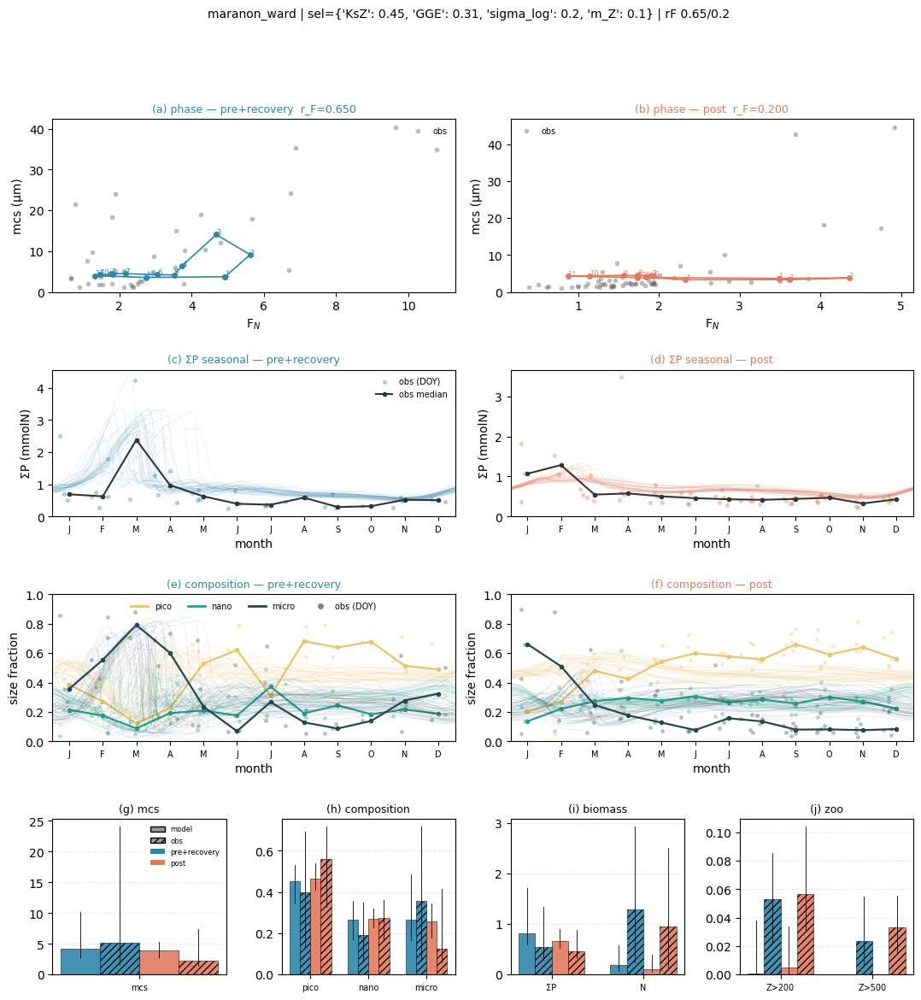


##### pre+recovery  r_F=0.65 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.45]
  grazing : KsZ 0.15  sigma_log 0.25  Q10 2.48
  scalars : GGE 0.33  growth-Q10 1.62  T_ref 20.0
  rates   : mP 0.0015  m_Z(quad) 0.05  m_Zlin 0.05  r_F 0.65
  detritus: k_remin 0.04  w_sink 5.0  ->  L = 125 m
  loss-fate routing (N / D / export):
     phyto mort : N 0.10 / D 0.90 / export 0.00
     graze unas : N 0.25 / D 0.75 / export 0.00
     zoo linear : N 0.10 / D 0.90 / export 0.00
     zoo quad   : N 0.10 / D 0.90 / export 0.00
     fish       : N 0.50 / D 0.25 / export 0.25
  forcing : n_harmonics 3  fit @ cruise DOY  | F_N[1.45-5.71]  d_e[30-54]  T[22.4-25.9]
  solver  : {'method': 'RK45', 'atol': 1e-09, 'rtol': 1e-06, 'max_step': 1.0, 'instability_neg_threshold': -0.001}

##### post  r_F=0.2 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04

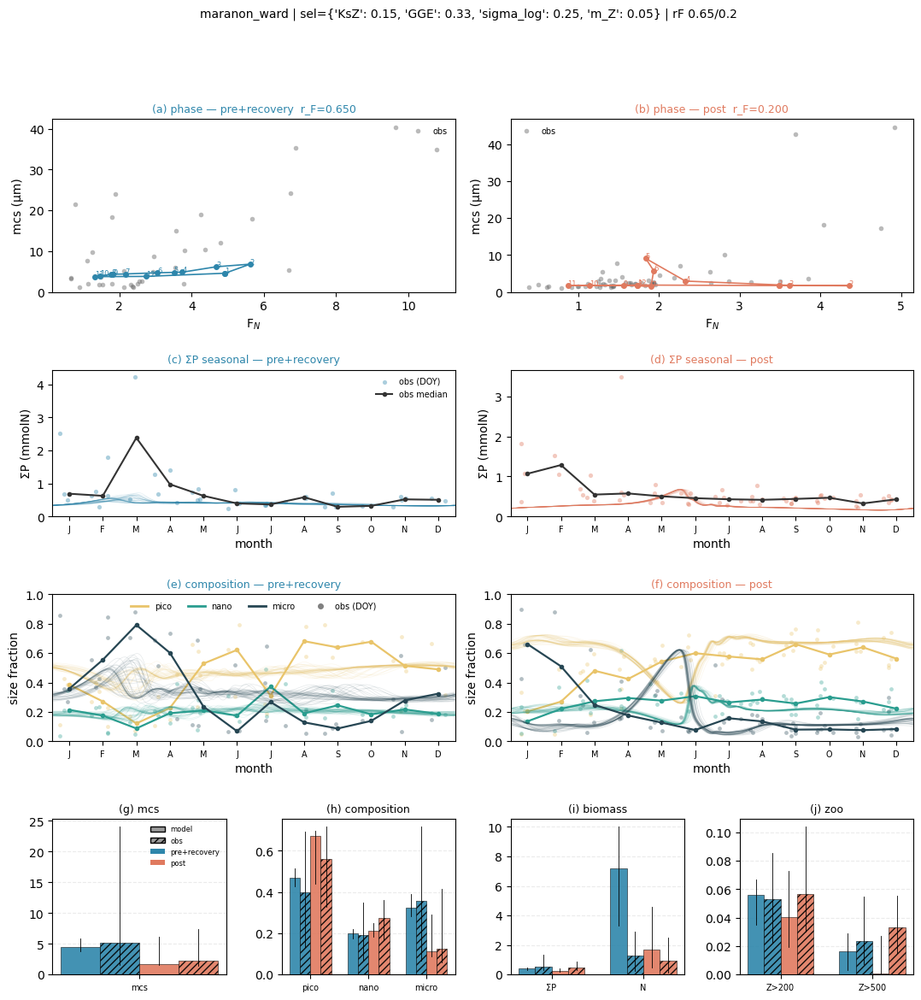

({'pre+recovery': {'t': array([0.0000e+00, 1.0000e+00, 2.0000e+00, ..., 2.1898e+04, 2.1899e+04,
          2.1900e+04], shape=(21901,)),
   'sumP': array([0.04      , 0.05261694, 0.0725125 , ..., 0.3216461 , 0.32252587,
          0.32346276], shape=(21901,)),
   'mcs': array([6.3       , 5.38395447, 4.83470087, ..., 3.48392863, 3.49543364,
          3.50782119], shape=(21901,)),
   'pico': array([0.3375    , 0.3352782 , 0.31967965, ..., 0.53427175, 0.53375562,
          0.53316292], shape=(21901,)),
   'nano': array([0.325     , 0.39768277, 0.47561164, ..., 0.18872781, 0.18832824,
          0.18797727], shape=(21901,)),
   'micro': array([0.3375    , 0.26703903, 0.20470871, ..., 0.27700045, 0.27791614,
          0.27885982], shape=(21901,)),
   'Z200': array([0.014     , 0.01032383, 0.00779425, ..., 0.03038767, 0.03052657,
          0.03068245], shape=(21901,)),
   'Z500': array([0.008     , 0.00546891, 0.00385808, ..., 0.00166982, 0.00158421,
          0.00150357], shape=(21901,)),
   

In [16]:
fig4_overview(RP,RQ,0.65,0.2,sel={'KsZ':0.45,'GGE':0.31,'sigma_log':0.2,'m_Z':0.1})
fig4_overview(RP,RQ,0.65,0.2,sel={'KsZ':0.15,'GGE':0.33,'sigma_log':0.25,'m_Z':0.05})


##### pre+recovery  r_F=0.65 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.45]
  grazing : KsZ 0.15  sigma_log 0.2  Q10 2.48
  scalars : GGE 0.25  growth-Q10 1.62  T_ref 20.0
  rates   : mP 0.0015  m_Z(quad) 0.05  m_Zlin 0.05  r_F 0.65
  detritus: k_remin 0.04  w_sink 5.0  ->  L = 125 m
  loss-fate routing (N / D / export):
     phyto mort : N 0.10 / D 0.90 / export 0.00
     graze unas : N 0.25 / D 0.75 / export 0.00
     zoo linear : N 0.10 / D 0.90 / export 0.00
     zoo quad   : N 0.10 / D 0.90 / export 0.00
     fish       : N 0.50 / D 0.25 / export 0.25
  forcing : n_harmonics 3  fit @ cruise DOY  | F_N[1.45-5.71]  d_e[30-54]  T[22.4-25.9]
  solver  : {'method': 'RK45', 'atol': 1e-09, 'rtol': 1e-06, 'max_step': 1.0, 'instability_neg_threshold': -0.001}

##### post  r_F=0.15 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04

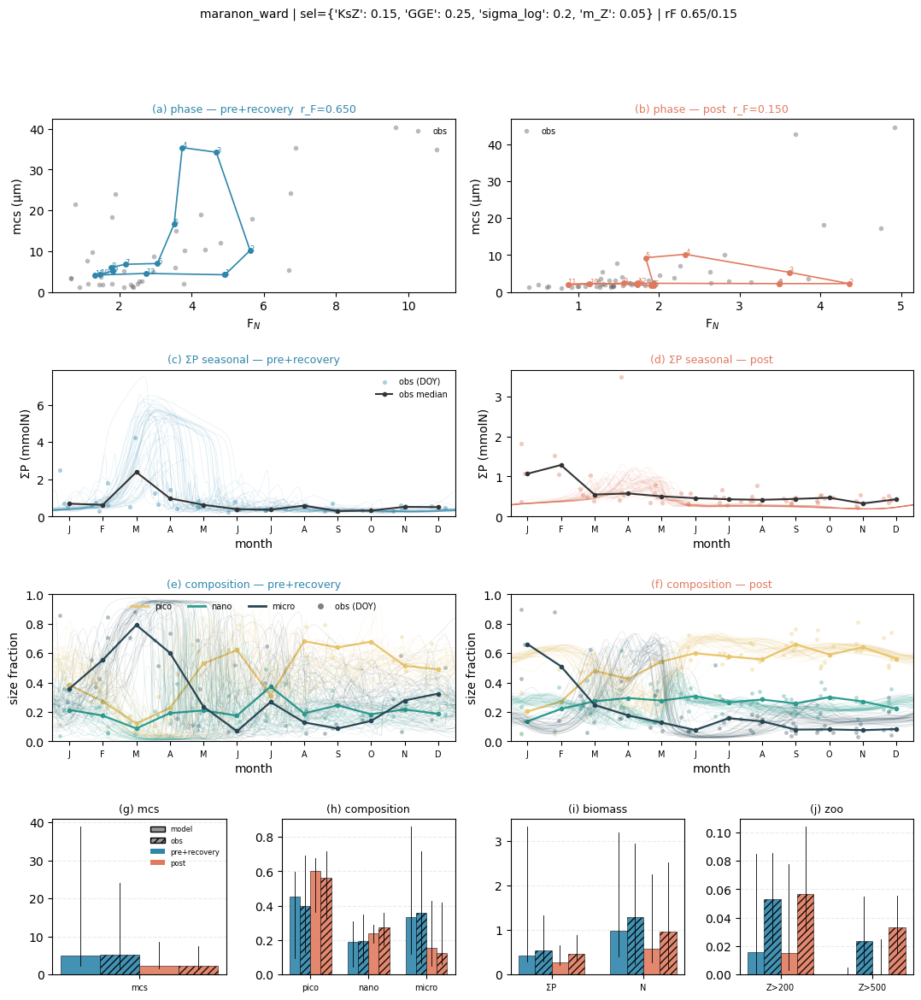


##### pre+recovery  r_F=0.3 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.45]
  grazing : KsZ 0.15  sigma_log 0.25  Q10 2.48
  scalars : GGE 0.33  growth-Q10 1.62  T_ref 20.0
  rates   : mP 0.0015  m_Z(quad) 0.05  m_Zlin 0.05  r_F 0.3
  detritus: k_remin 0.04  w_sink 5.0  ->  L = 125 m
  loss-fate routing (N / D / export):
     phyto mort : N 0.10 / D 0.90 / export 0.00
     graze unas : N 0.25 / D 0.75 / export 0.00
     zoo linear : N 0.10 / D 0.90 / export 0.00
     zoo quad   : N 0.10 / D 0.90 / export 0.00
     fish       : N 0.50 / D 0.25 / export 0.25
  forcing : n_harmonics 3  fit @ cruise DOY  | F_N[1.45-5.71]  d_e[30-54]  T[22.4-25.9]
  solver  : {'method': 'RK45', 'atol': 1e-09, 'rtol': 1e-06, 'max_step': 1.0, 'instability_neg_threshold': -0.001}

##### post  r_F=0.1 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-1

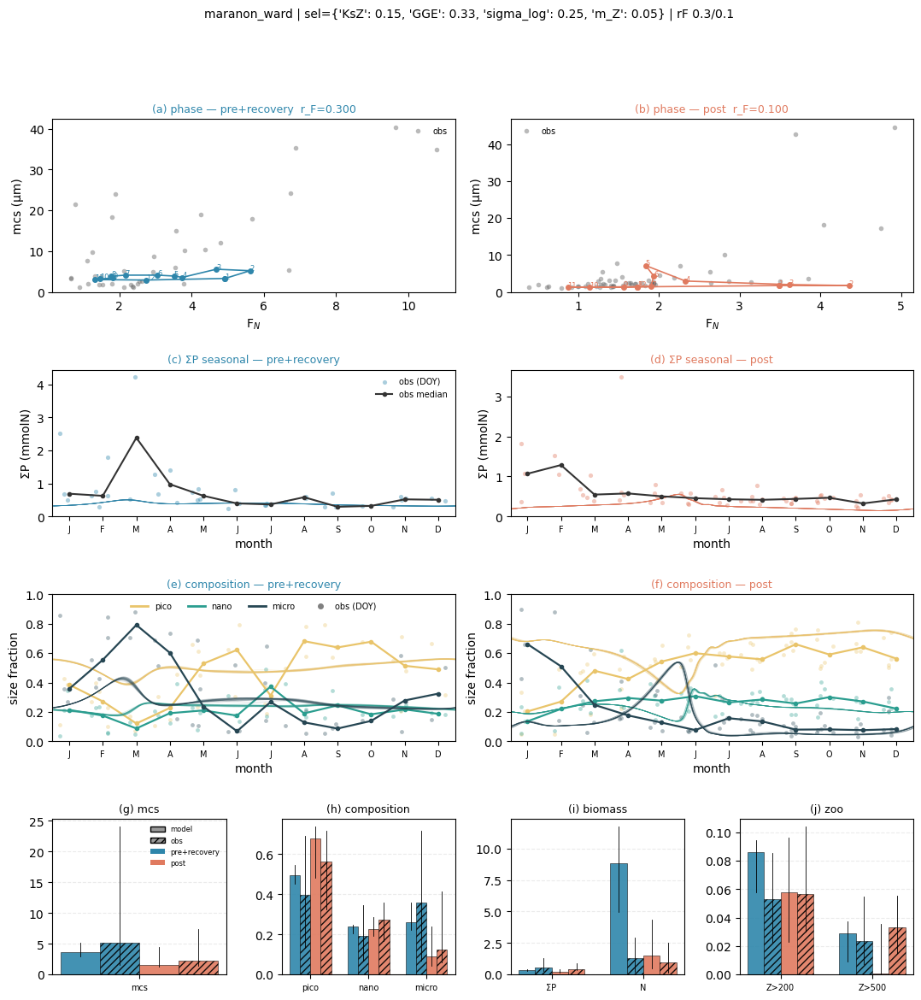

({'pre+recovery': {'t': array([0.0000e+00, 1.0000e+00, 2.0000e+00, ..., 2.1898e+04, 2.1899e+04,
          2.1900e+04], shape=(21901,)),
   'sumP': array([0.04      , 0.05309784, 0.07360267, ..., 0.31947717, 0.3201867 ,
          0.32095173], shape=(21901,)),
   'mcs': array([6.3       , 5.44594996, 4.91681428, ..., 2.90834959, 2.91672407,
          2.92597944], shape=(21901,)),
   'pico': array([0.3375    , 0.33367113, 0.31755199, ..., 0.56036222, 0.55997457,
          0.55952342], shape=(21901,)),
   'nano': array([0.325     , 0.39592465, 0.47255276, ..., 0.2149695 , 0.21449606,
          0.21402244], shape=(21901,)),
   'micro': array([0.3375    , 0.27040422, 0.20989525, ..., 0.22466828, 0.22552937,
          0.22645414], shape=(21901,)),
   'Z200': array([0.014     , 0.011819  , 0.01004235, ..., 0.05399287, 0.05390629,
          0.05383627], shape=(21901,)),
   'Z500': array([0.008     , 0.00651094, 0.00533882, ..., 0.00730144, 0.00717235,
          0.0070474 ], shape=(21901,)),
   

In [17]:
fig4_overview(RP,RQ,0.65,0.15,sel={'KsZ':0.15,'GGE':0.25,'sigma_log':0.2,'m_Z':0.05})
fig4_overview(RP,RQ,0.3,0.1,sel={'KsZ':0.15,'GGE':0.33,'sigma_log':0.25,'m_Z':0.05})


##### pre+recovery  r_F=0.4 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.45]
  grazing : KsZ 0.23  sigma_log 0.2  Q10 2.48
  scalars : GGE 0.25  growth-Q10 1.62  T_ref 20.0
  rates   : mP 0.0015  m_Z(quad) 0.2  m_Zlin 0.05  r_F 0.4
  detritus: k_remin 0.04  w_sink 5.0  ->  L = 125 m
  loss-fate routing (N / D / export):
     phyto mort : N 0.10 / D 0.90 / export 0.00
     graze unas : N 0.25 / D 0.75 / export 0.00
     zoo linear : N 0.10 / D 0.90 / export 0.00
     zoo quad   : N 0.10 / D 0.90 / export 0.00
     fish       : N 0.50 / D 0.25 / export 0.25
  forcing : n_harmonics 3  fit @ cruise DOY  | F_N[1.45-5.71]  d_e[30-54]  T[22.4-25.9]
  solver  : {'method': 'RK45', 'atol': 1e-09, 'rtol': 1e-06, 'max_step': 1.0, 'instability_neg_threshold': -0.001}

##### post  r_F=0.2 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.

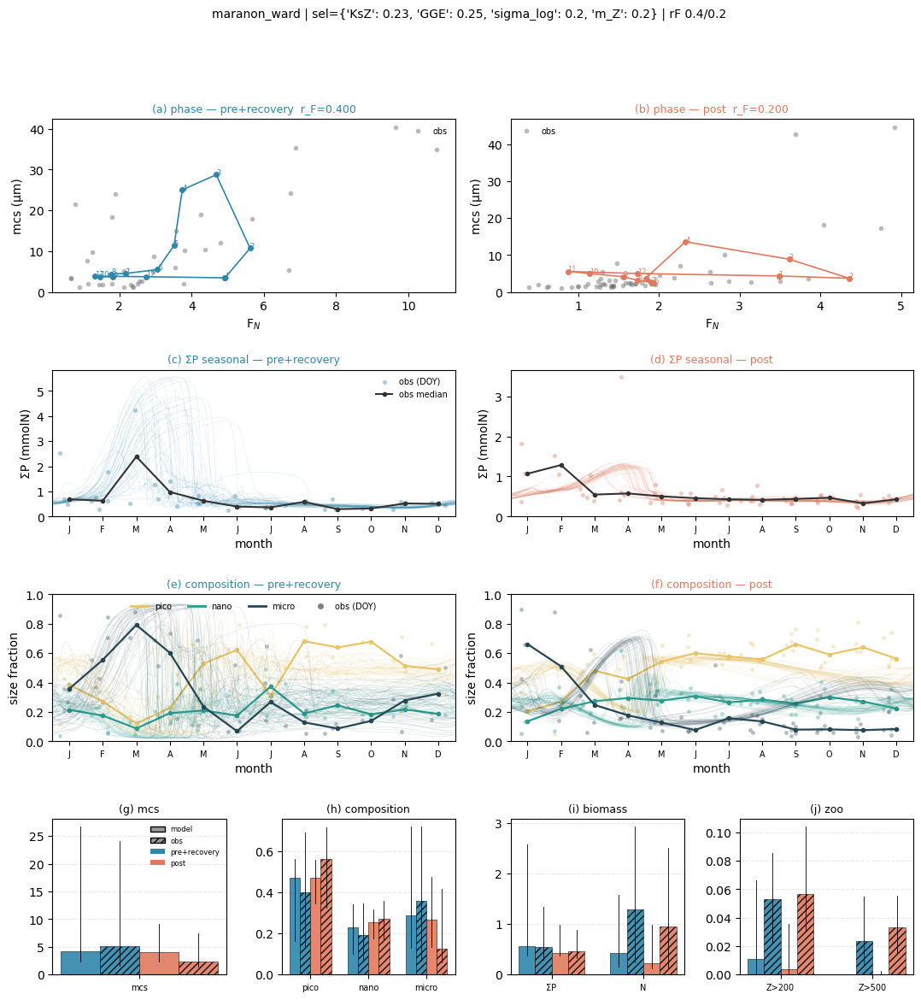


##### pre+recovery  r_F=0.65 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.45]
  grazing : KsZ 0.45  sigma_log 0.15  Q10 2.48
  scalars : GGE 0.25  growth-Q10 1.62  T_ref 20.0
  rates   : mP 0.0015  m_Z(quad) 0.2  m_Zlin 0.05  r_F 0.65
  detritus: k_remin 0.04  w_sink 5.0  ->  L = 125 m
  loss-fate routing (N / D / export):
     phyto mort : N 0.10 / D 0.90 / export 0.00
     graze unas : N 0.25 / D 0.75 / export 0.00
     zoo linear : N 0.10 / D 0.90 / export 0.00
     zoo quad   : N 0.10 / D 0.90 / export 0.00
     fish       : N 0.50 / D 0.25 / export 0.25
  forcing : n_harmonics 3  fit @ cruise DOY  | F_N[1.45-5.71]  d_e[30-54]  T[22.4-25.9]
  solver  : {'method': 'RK45', 'atol': 1e-09, 'rtol': 1e-06, 'max_step': 1.0, 'instability_neg_threshold': -0.001}

##### post  r_F=0.1 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-

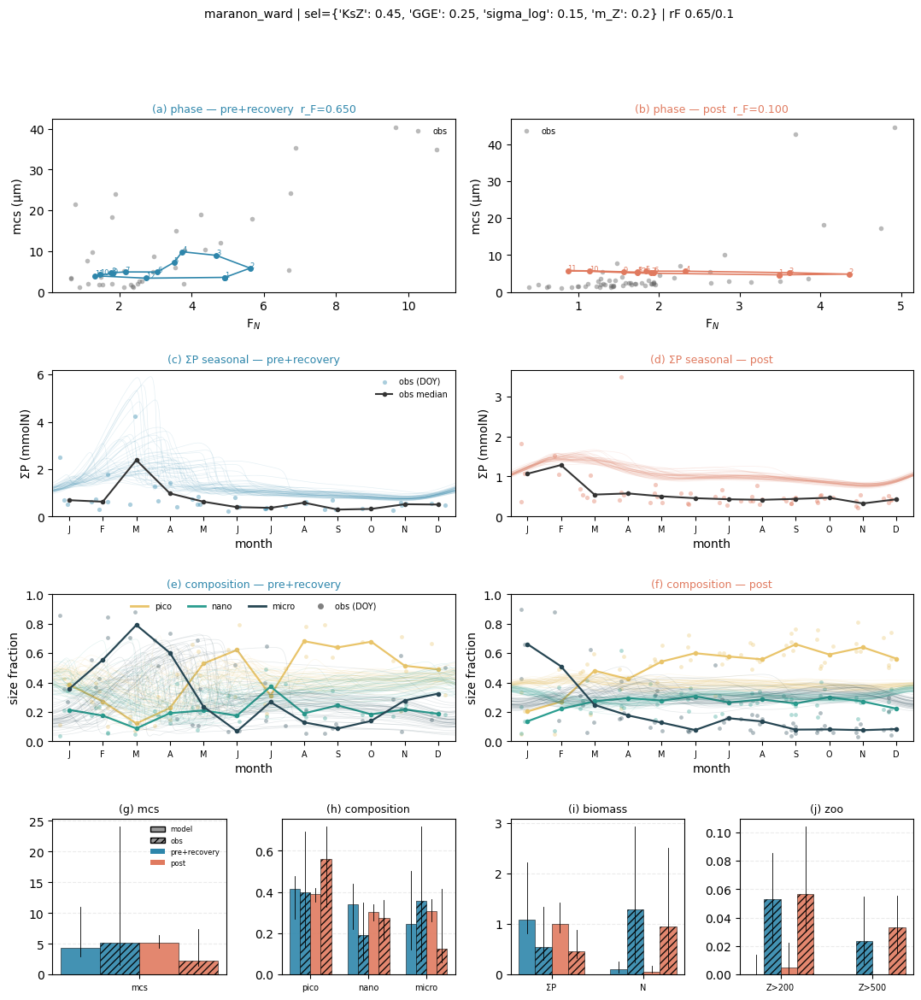

({'pre+recovery': {'t': array([0.0000e+00, 1.0000e+00, 2.0000e+00, ..., 2.1898e+04, 2.1899e+04,
          2.1900e+04], shape=(21901,)),
   'sumP': array([0.04      , 0.05362818, 0.07593938, ..., 1.11012707, 1.12521507,
          1.14044247], shape=(21901,)),
   'mcs': array([6.3       , 5.32372564, 4.73202347, ..., 2.65110103, 2.6530358 ,
          2.65441704], shape=(21901,)),
   'pico': array([0.3375    , 0.33675482, 0.32208675, ..., 0.43747493, 0.43771307,
          0.43809418], shape=(21901,)),
   'nano': array([0.325     , 0.39961524, 0.48012017, ..., 0.5009644 , 0.5001713 ,
          0.49918304], shape=(21901,)),
   'micro': array([0.3375    , 0.26362994, 0.19779309, ..., 0.06156066, 0.06211563,
          0.06272278], shape=(21901,)),
   'Z200': array([1.40000000e-02, 1.02210052e-02, 7.63879800e-03, ...,
          4.90129390e-23, 4.34455883e-23, 3.86988143e-23], shape=(21901,)),
   'Z500': array([0.008     , 0.00542135, 0.00379392, ..., 0.        , 0.        ,
          0.       

In [18]:
fig4_overview(RP,RQ,0.4,0.2,sel={'KsZ':0.23,'GGE':0.25,'sigma_log':0.2,'m_Z':0.2})
fig4_overview(RP,RQ,0.65,0.1,sel={'KsZ':0.45,'GGE':0.25,'sigma_log':0.15,'m_Z':0.2})

In [19]:
import numpy as np, pandas as pd, seasonal_scan_harness as ssh
from collections import defaultdict
RP = ssh.load_results('seasonal_grid_pre_2026-06-29.pkl')
RQ = ssh.load_results('seasonal_grid_post_2026-06-29.pkl')
obs_m = ssh.build_obs_monthly(['pre+recovery','post']); _MO=np.arange(1,13)
def obs_cycle(g):
    s = obs_m[g].dropna(subset=['mcs']); return s.groupby('mo')['mcs'].median().reindex(_MO).to_numpy()
log_oc = {g: np.log10(obs_cycle(g)) for g in ('pre+recovery','post')}
CK=['KsZ','GGE','sigma_log','m_Z']
def ck(r): return tuple(round(r[k],4) for k in CK)
def brmse(r,g):
    c=np.asarray(r.get('clim_mcs',[np.nan]*12),float); return float(np.sqrt(np.nanmean((np.log10(c)-log_oc[g])**2)))
def bloom(r): 
    cz=np.asarray(r.get('clim_sumP',[np.nan]*12),float); return int(np.nanargmax(cz)+1) if np.isfinite(cz).any() else 0
Qby=defaultdict(list)
for q in RQ.records: Qby[ck(q)].append(q)
rows=[]
for p in RP.records:
    if p.get('has_nan'): continue
    bp=brmse(p,'pre+recovery')
    for q in Qby.get(ck(p),[]):
        if q.get('has_nan') or q['fish']>p['fish']+1e-9: continue
        rows.append(dict(KsZ=p['KsZ'],GGE=p['GGE'],sig=p['sigma_log'],mZ=p['m_Z'],
            rFpre=round(p['fish'],2),rFpost=round(q['fish'],2),
            brmse_pre=round(bp,3), brmse_post=round(brmse(q,'post'),3),
            brmse=round(max(bp,brmse(q,'post')),3), blPre=bloom(p), blPost=bloom(q)))
X=pd.DataFrame(rows)
def call(r): return (f"diagnose_pair(RP,RQ,{r.rFpre},{r.rFpost},"
                     f"sel={{'KsZ':{r.KsZ},'GGE':{r.GGE},'sigma_log':{r.sig},'m_Z':{r.mZ}}})")
print(f"obs mcs cycle: pre peak month {int(np.nanargmax(obs_cycle('pre+recovery'))+1)}, "
      f"post peak month {int(np.nanargmax(obs_cycle('post'))+1)}")
print("bloom_rmse LOW = model mcs cycle matches obs (pronounced, right timing); HIGH = flat/dead or wrong-phase\n")
s=X.sort_values('brmse')
for lbl,r in [('LOW ',s.iloc[0]),('mid ',s.iloc[len(s)//2]),('HIGH',s.iloc[-1])]:
    print(f"{lbl} brmse={r.brmse} (pre {r.brmse_pre}/post {r.brmse_post}) ΣP-peak {r.blPre}/{r.blPost}\n     {call(r)}")
k23=X[X.KsZ==0.23].sort_values('brmse').iloc[0]
print(f"\nbest brmse @ KsZ 0.23 (your family): brmse={k23.brmse} (pre {k23.brmse_pre}/post {k23.brmse_post})\n     {call(k23)}")

obs mcs cycle: pre peak month 3, post peak month 2
bloom_rmse LOW = model mcs cycle matches obs (pronounced, right timing); HIGH = flat/dead or wrong-phase

LOW  brmse=0.342 (pre 0.297/post 0.342) ΣP-peak 3.0/3.0
     diagnose_pair(RP,RQ,0.6,0.2,sel={'KsZ':0.23,'GGE':0.31,'sigma_log':0.15,'m_Z':0.1})
mid  brmse=0.411 (pre 0.329/post 0.411) ΣP-peak 3.0/2.0
     diagnose_pair(RP,RQ,0.65,0.15,sel={'KsZ':0.45,'GGE':0.31,'sigma_log':0.15,'m_Z':0.2})
HIGH brmse=0.59 (pre 0.59/post 0.46) ΣP-peak 5.0/5.0
     diagnose_pair(RP,RQ,0.3,0.2,sel={'KsZ':0.15,'GGE':0.31,'sigma_log':0.2,'m_Z':0.1})

best brmse @ KsZ 0.23 (your family): brmse=0.342 (pre 0.318/post 0.342)
     diagnose_pair(RP,RQ,0.4,0.2,sel={'KsZ':0.23,'GGE':0.31,'sigma_log':0.15,'m_Z':0.1})


--- pre+recovery  r_F=0.6  sel={'KsZ': 0.23, 'GGE': 0.33, 'sigma_log': 0.2, 'm_Z': 0.05} ---
=== diagnose [pre+recovery] ===
metric    mod_mean  obs_mean   mod_med   obs_med  d_mean   d_med
mcs           6.78      9.94       3.5      5.14   -0.32   -0.32
pico         0.474     0.418     0.508     0.399   +0.13   +0.27
nano         0.221      0.21     0.222     0.193   +0.05   +0.15
micro        0.305     0.372     0.254     0.357   -0.18   -0.29
sumP         0.735     0.748     0.471      0.55   -0.02   -0.14
N             1.21      1.51      0.81      1.29   -0.20   -0.37
PP           0.146     0.542     0.122      0.28   -0.73   -0.56
Export        2.96      3.52      2.74      2.64   -0.16   +0.04
Z200        0.0383    0.0533    0.0126     0.053   -0.28   -0.76
Z500      8.62e-05    0.0302  1.41e-16    0.0235   -1.00   -1.00
score   mean=0.197  med=0.265  joint(max)=0.265   (on ['mcs', 'pico', 'nano', 'micro'])
flags   has_nan=False nan_frac=0.00 mcs_conv=0.93 Z200_peak=0.168 cv_sum

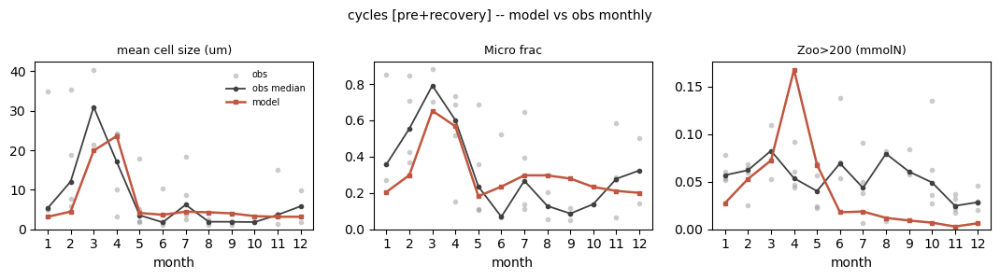

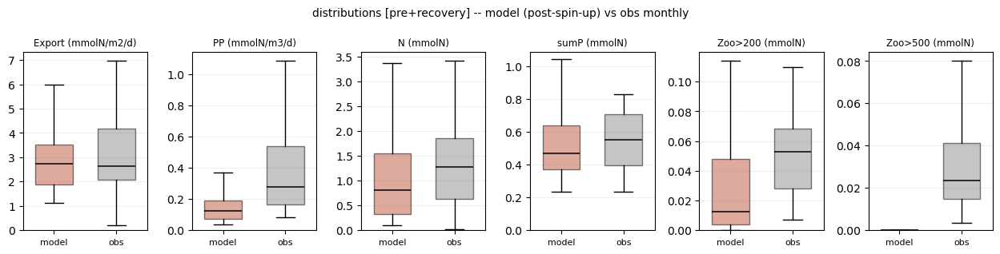

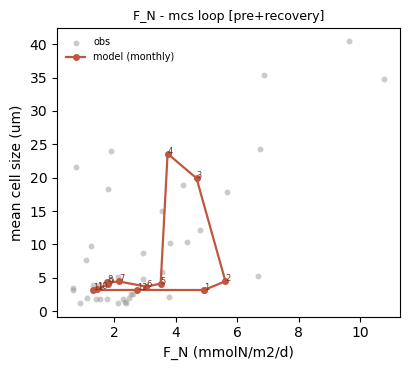

--- post  r_F=0.15  sel={'KsZ': 0.23, 'GGE': 0.33, 'sigma_log': 0.2, 'm_Z': 0.05} ---
=== diagnose [post] ===
metric    mod_mean  obs_mean   mod_med   obs_med  d_mean   d_med
mcs           2.79      4.67      2.23      2.32   -0.40   -0.04
pico         0.584     0.542     0.606     0.562   +0.08   +0.08
nano         0.236     0.267     0.238     0.272   -0.12   -0.13
micro         0.18     0.191     0.156     0.124   -0.06   +0.26
sumP         0.389     0.581     0.332     0.459   -0.33   -0.28
N            0.622      1.23     0.342     0.959   -0.50   -0.64
PP          0.0896     0.324    0.0719     0.202   -0.72   -0.64
Export        2.25      2.67      1.95      2.17   -0.16   -0.10
Z200        0.0303     0.066    0.0159    0.0566   -0.54   -0.72
Z500        0.0074    0.0371  6.99e-05    0.0334   -0.80   -1.00
score   mean=0.215  med=0.149  joint(max)=0.215   (on ['mcs', 'pico', 'nano', 'micro'])
flags   has_nan=False nan_frac=0.00 mcs_conv=0.98 Z200_peak=0.087 cv_sumP=0.36
        

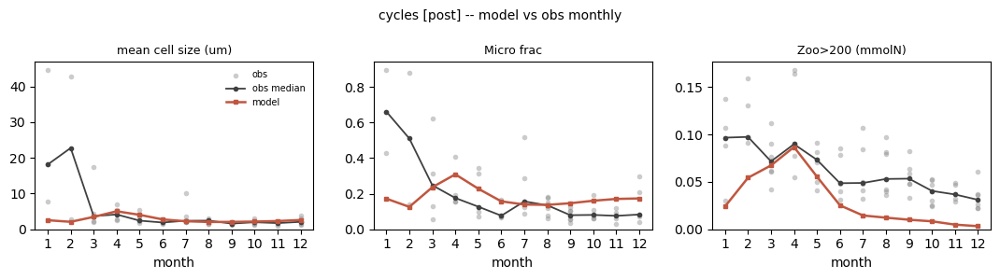

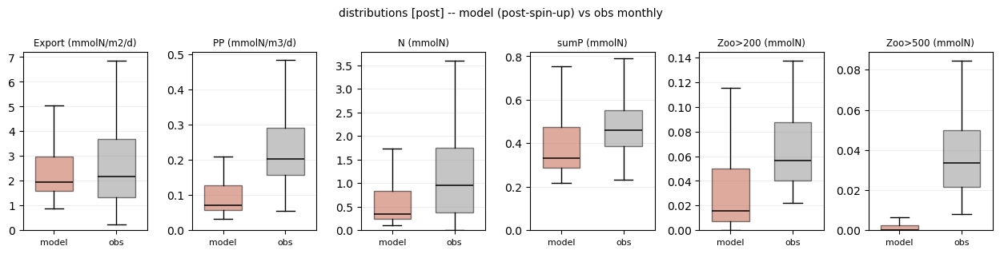

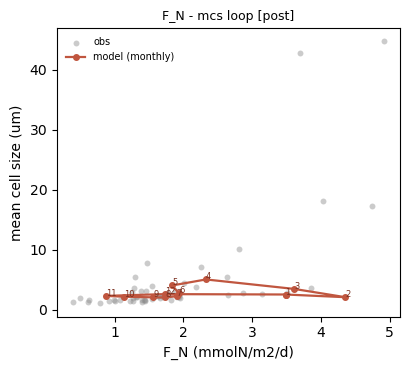

 KsZ  GGE  sigma_log  m_Z  pre_fish  post_fish  joint  bloom_rmse  amp_contr  dur_contr  pre_Z200  post_Z200
0.23 0.31       0.20 0.05      0.60       0.10  0.308       0.193       25.3          3     0.011      0.013
0.23 0.33       0.20 0.05      0.65       0.10  0.298       0.207       25.2          2     0.015      0.014
0.23 0.33       0.20 0.10      0.60       0.10  0.302       0.213       21.8          4     0.011      0.014
0.23 0.33       0.25 0.20      0.55       0.10  0.253       0.219        8.8          1     0.016      0.013
0.23 0.25       0.25 0.10      0.30       0.15  0.267       0.222       15.5          0     0.017      0.012
0.23 0.31       0.20 0.10      0.65       0.10  0.246       0.225       25.5          4     0.004      0.013
0.23 0.33       0.25 0.05      0.65       0.15  0.299       0.227       14.3          2     0.024      0.018
0.23 0.31       0.25 0.10      0.60       0.10  0.261       0.227       12.2          1     0.017      0.015
0.23 0.25       0.2

In [22]:
import numpy as np, seasonal_scan_harness as ssh, seasonal_diagnostics as sd
import importlib; importlib.reload(sd)
# RP, RQ already loaded from the grid pickles

def diagnose_pair(RP, RQ, rF_pre, rF_post, sel=None, construct='maranon_ward',
                  years=60, spinup=15, n_harmonics=3, routed=True):
    """Re-run a (pre,post) grid candidate with full trajectory and run
    seasonal_diagnostics.diagnose on each era: print table + cycles + boxes + fn_loop."""
    spec = ssh.allometry(construct) if isinstance(construct,str) else construct
    obs_t = ssh.build_obs_targets(['pre+recovery','post'])
    obs_m = ssh.build_obs_monthly(['pre+recovery','post'], forcing_complete=True)
    def find(R,f):
        for r in R.records:
            if abs(r['fish']-f)<1e-9 and all(abs(r.get(k,np.nan)-v)<1e-9 for k,v in (sel or {}).items()): return r
        raise ValueError(f"no record fish={f} sel={sel}")
    rec=find(RP,rF_pre); ivo,mP,mZ={},None,None
    for k in RP.param_names:
        v=rec[k]
        if k=='mP': mP=v; continue
        if k=='m_Z': mZ=v; continue
        if k in ('mu_scale','graze_scale'): continue
        slot,key=ssh._PARAM_SLOT[k]; ivo.setdefault(slot,{})[key]=v
    out={}
    for g,f in [('pre+recovery',rF_pre),('post',rF_post)]:
        clim,r = ssh.run_one(spec, RP.forcings[g], fish_rate=f, mP=mP, m_Z=mZ, iv_overrides=ivo,
                             years=years, spinup=spinup, n_harmonics=n_harmonics, routed=routed, return_traj=True)
        sd.diagnose(clim, r, g, spinup, obs_t, obs_m, title=f"--- {g}  r_F={f}  sel={sel} ---")
        out[g]=(clim,r)
    return out

# your current baseline candidate, full diagnose view (print + cycles + boxes + fn_loop):
_ = diagnose_pair(RP, RQ, 0.60, 0.15, sel={'KsZ':0.23,'GGE':0.33,'sigma_log':0.20,'m_Z':0.05})

# and survey()'s existing scorecard on the combined grid (note bloom_rmse, amp/dur contrasts):
res_all = ssh.SeasonalScanResult(RP.records+RQ.records, {**RP.obs,**RQ.obs}, RP.forcings, RP.param_names)
S = sd.survey(res_all, ssh.build_obs_monthly(['pre+recovery','post']))
print(S.sort_values('bloom_rmse')[['KsZ','GGE','sigma_log','m_Z','pre_fish','post_fish',
      'joint','bloom_rmse','amp_contr','dur_contr','pre_Z200','post_Z200']].head(20).to_string(index=False))

In [ ]:
# bloom_rmse validation — LOW should match the obs mcs cycle (pronounced, peak ~March), HIGH = wrong-phase/flat
diagnose_pair(RP, RQ, 0.6,  0.2,  sel={'KsZ':0.23,'GGE':0.31,'sigma_log':0.15,'m_Z':0.1})   # LOW  brmse 0.342
#diagnose_pair(RP, RQ, 0.3,  0.2,  sel={'KsZ':0.15,'GGE':0.31,'sigma_log':0.2, 'm_Z':0.1})   # HIGH brmse 0.59  (ΣP peak May)
#diagnose_pair(RP, RQ, 0.65, 0.15, sel={'KsZ':0.45,'GGE':0.31,'sigma_log':0.15,'m_Z':0.2})   # mid  brmse 0.411

# your current candidate, for reference in the same diagnose view:
#iagnose_pair(RP, RQ, 0.6,  0.15, sel={'KsZ':0.23,'GGE':0.33,'sigma_log':0.20,'m_Z':0.05})


##### pre+recovery  r_F=0.6 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.45]
  grazing : KsZ 0.23  sigma_log 0.15  Q10 2.48
  scalars : GGE 0.31  growth-Q10 1.62  T_ref 20.0
  rates   : mP 0.0015  m_Z(quad) 0.1  m_Zlin 0.05  r_F 0.6
  detritus: k_remin 0.04  w_sink 5.0  ->  L = 125 m
  loss-fate routing (N / D / export):
     phyto mort : N 0.10 / D 0.90 / export 0.00
     graze unas : N 0.25 / D 0.75 / export 0.00
     zoo linear : N 0.10 / D 0.90 / export 0.00
     zoo quad   : N 0.10 / D 0.90 / export 0.00
     fish       : N 0.50 / D 0.25 / export 0.25
  forcing : n_harmonics 3  fit @ cruise DOY  | F_N[1.45-5.71]  d_e[30-54]  T[22.4-25.9]
  solver  : {'method': 'RK45', 'atol': 1e-09, 'rtol': 1e-06, 'max_step': 1.0, 'instability_neg_threshold': -0.001}

##### post  r_F=0.2 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10

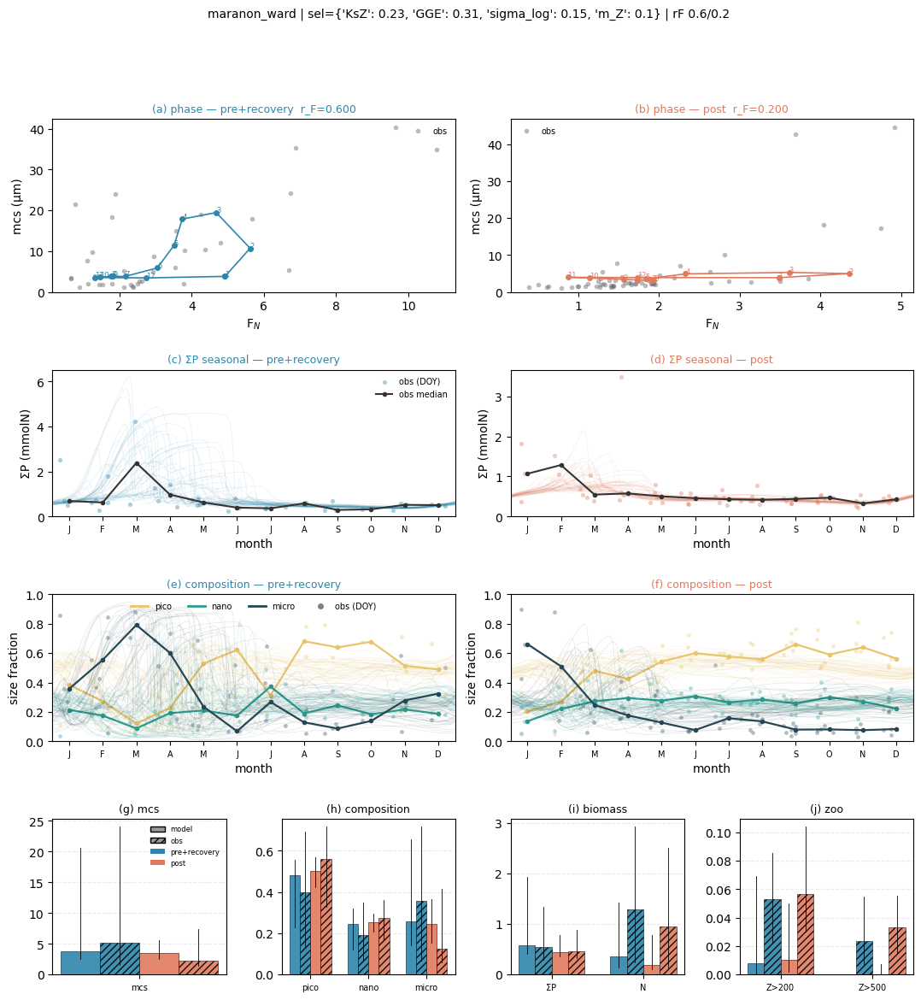


##### pre+recovery  r_F=0.3 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.45]
  grazing : KsZ 0.15  sigma_log 0.2  Q10 2.48
  scalars : GGE 0.31  growth-Q10 1.62  T_ref 20.0
  rates   : mP 0.0015  m_Z(quad) 0.1  m_Zlin 0.05  r_F 0.3
  detritus: k_remin 0.04  w_sink 5.0  ->  L = 125 m
  loss-fate routing (N / D / export):
     phyto mort : N 0.10 / D 0.90 / export 0.00
     graze unas : N 0.25 / D 0.75 / export 0.00
     zoo linear : N 0.10 / D 0.90 / export 0.00
     zoo quad   : N 0.10 / D 0.90 / export 0.00
     fish       : N 0.50 / D 0.25 / export 0.25
  forcing : n_harmonics 3  fit @ cruise DOY  | F_N[1.45-5.71]  d_e[30-54]  T[22.4-25.9]
  solver  : {'method': 'RK45', 'atol': 1e-09, 'rtol': 1e-06, 'max_step': 1.0, 'instability_neg_threshold': -0.001}

##### post  r_F=0.2 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.

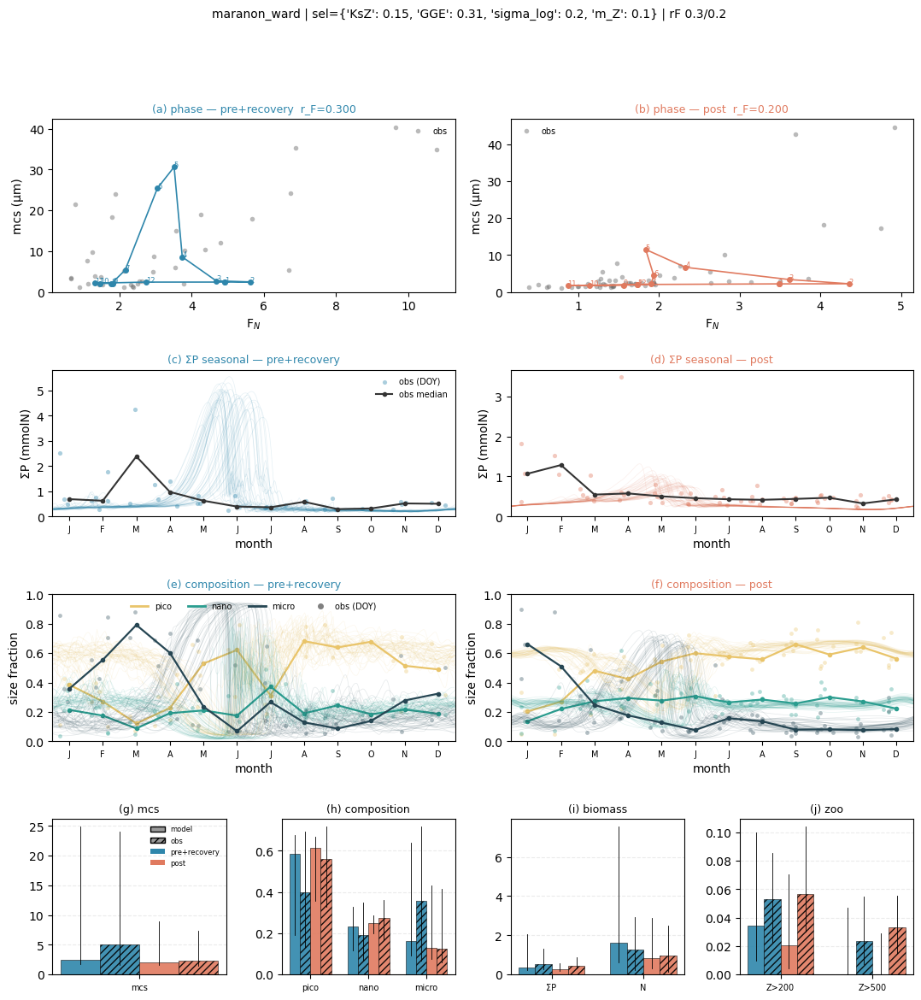


##### pre+recovery  r_F=0.65 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.45]
  grazing : KsZ 0.45  sigma_log 0.15  Q10 2.48
  scalars : GGE 0.31  growth-Q10 1.62  T_ref 20.0
  rates   : mP 0.0015  m_Z(quad) 0.2  m_Zlin 0.05  r_F 0.65
  detritus: k_remin 0.04  w_sink 5.0  ->  L = 125 m
  loss-fate routing (N / D / export):
     phyto mort : N 0.10 / D 0.90 / export 0.00
     graze unas : N 0.25 / D 0.75 / export 0.00
     zoo linear : N 0.10 / D 0.90 / export 0.00
     zoo quad   : N 0.10 / D 0.90 / export 0.00
     fish       : N 0.50 / D 0.25 / export 0.25
  forcing : n_harmonics 3  fit @ cruise DOY  | F_N[1.45-5.71]  d_e[30-54]  T[22.4-25.9]
  solver  : {'method': 'RK45', 'atol': 1e-09, 'rtol': 1e-06, 'max_step': 1.0, 'instability_neg_threshold': -0.001}

##### post  r_F=0.15 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04

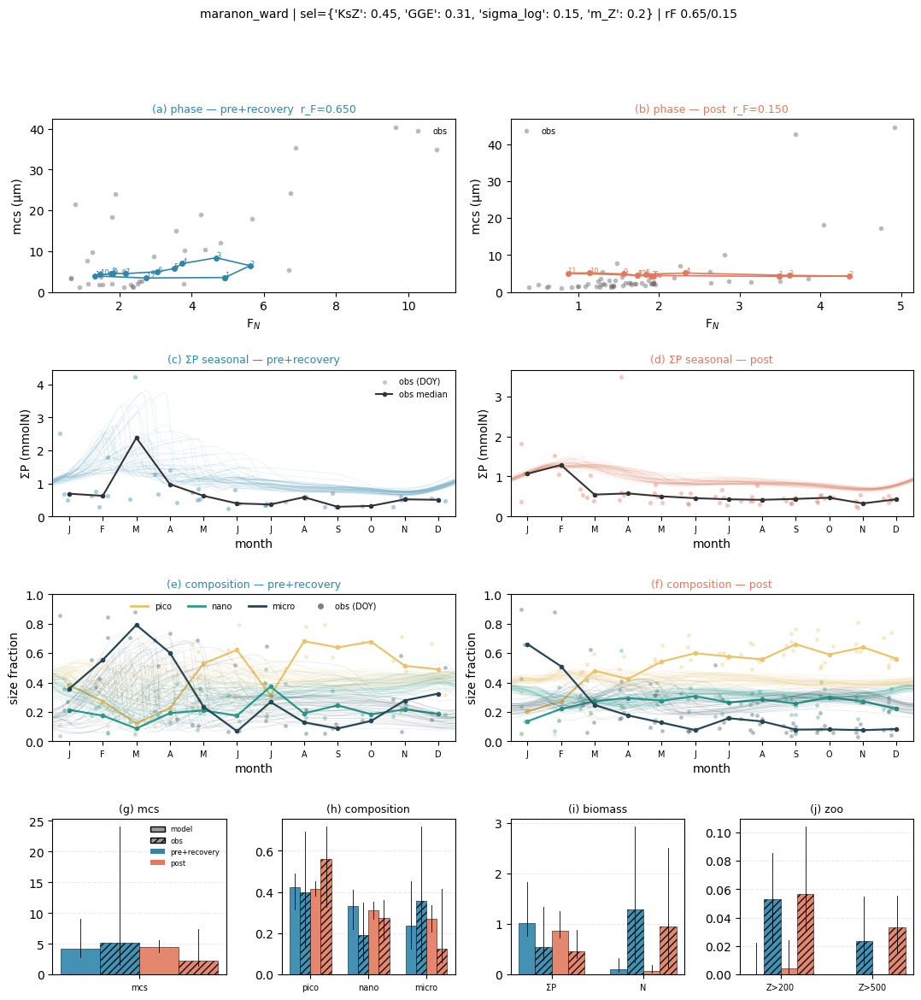

({'pre+recovery': {'t': array([0.0000e+00, 1.0000e+00, 2.0000e+00, ..., 2.1898e+04, 2.1899e+04,
          2.1900e+04], shape=(21901,)),
   'sumP': array([0.04      , 0.05362817, 0.07593933, ..., 1.00011857, 1.01217099,
          1.02411452], shape=(21901,)),
   'mcs': array([6.3       , 5.32372568, 4.73202357, ..., 2.74511013, 2.74944324,
          2.75511407], shape=(21901,)),
   'pico': array([0.3375    , 0.33675483, 0.32208682, ..., 0.46154643, 0.46197934,
          0.4622422 ], shape=(21901,)),
   'nano': array([0.325     , 0.39961522, 0.48012001, ..., 0.43768791, 0.4361371 ,
          0.43471657], shape=(21901,)),
   'micro': array([0.3375    , 0.26362995, 0.19779317, ..., 0.10076566, 0.10188355,
          0.10304123], shape=(21901,)),
   'Z200': array([1.40000000e-02, 1.02213744e-02, 7.63938167e-03, ...,
          7.04212586e-06, 7.52691340e-06, 8.11020863e-06], shape=(21901,)),
   'Z500': array([0.008     , 0.00542148, 0.0037941 , ..., 0.        , 0.        ,
          0.       

In [25]:
# bloom_rmse validation — LOW should match the obs mcs cycle (pronounced, peak ~March), HIGH = wrong-phase/flat
fig4_overview(RP, RQ, 0.6,  0.2,  sel={'KsZ':0.23,'GGE':0.31,'sigma_log':0.15,'m_Z':0.1})   # LOW  brmse 0.342
fig4_overview(RP, RQ, 0.3,  0.2,  sel={'KsZ':0.15,'GGE':0.31,'sigma_log':0.2, 'm_Z':0.1})   # HIGH brmse 0.59  (ΣP peak May)
fig4_overview(RP, RQ, 0.65, 0.15, sel={'KsZ':0.45,'GGE':0.31,'sigma_log':0.15,'m_Z':0.2})   # mid  brmse 0.411

# your current candidate, for reference in the same diagnose view:
# fig4_overview(RP, RQ, 0.6,  0.15, sel={'KsZ':0.23,'GGE':0.33,'sigma_log':0.20,'m_Z':0.05})

In [26]:
import numpy as np, seasonal_scan_harness as ssh
def _squiggle(r, key, spinup=15):
    keep=r['t']>=spinup*365.0; t=r['t'][keep]; v=np.asarray(r[key],float)[keep]
    yr=(t//365).astype(int); mo=np.clip(np.searchsorted(ssh._MEDGES,np.mod(t,365.0),'right')+1,1,12)
    ys=np.unique(yr); M=np.full((len(ys),12),np.nan)
    for i,y in enumerate(ys):
        for m in range(1,13):
            sel=v[(yr==y)&(mo==m)]
            if sel.size: M[i,m-1]=np.nanmean(sel)
    return float(np.nanmean(np.nanstd(M,axis=0))/max(np.nanmean(v),1e-9))   # interannual cycle spread / mean

def squiggle_report(runs, spinup=15):
    for g,r in runs.items():
        print(f"{g:14s} squiggle  ΣP {_squiggle(r,'sumP',spinup):.3f}   micro {_squiggle(r,'micro',spinup):.3f}"
              f"   (interannual cycle spread / mean — HIGH = spaghetti)")


##### pre+recovery  r_F=0.6 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.45]
  grazing : KsZ 0.23  sigma_log 0.15  Q10 2.48
  scalars : GGE 0.31  growth-Q10 1.62  T_ref 20.0
  rates   : mP 0.0015  m_Z(quad) 0.1  m_Zlin 0.05  r_F 0.6
  detritus: k_remin 0.04  w_sink 5.0  ->  L = 125 m
  loss-fate routing (N / D / export):
     phyto mort : N 0.10 / D 0.90 / export 0.00
     graze unas : N 0.25 / D 0.75 / export 0.00
     zoo linear : N 0.10 / D 0.90 / export 0.00
     zoo quad   : N 0.10 / D 0.90 / export 0.00
     fish       : N 0.50 / D 0.25 / export 0.25
  forcing : n_harmonics 3  fit @ cruise DOY  | F_N[1.45-5.71]  d_e[30-54]  T[22.4-25.9]
  solver  : {'method': 'RK45', 'atol': 1e-09, 'rtol': 1e-06, 'max_step': 1.0, 'instability_neg_threshold': -0.001}

##### post  r_F=0.2 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10

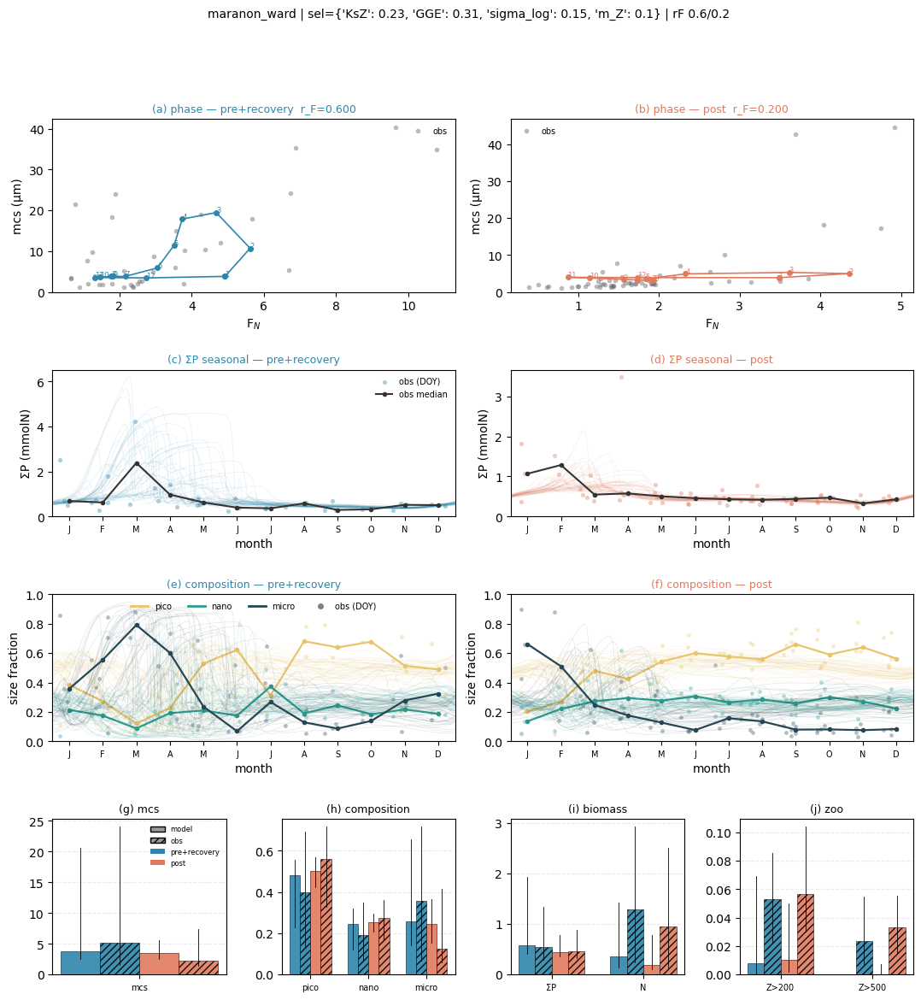

pre+recovery   squiggle  ΣP 0.401   micro 0.417   (interannual cycle spread / mean — HIGH = spaghetti)
post           squiggle  ΣP 0.122   micro 0.303   (interannual cycle spread / mean — HIGH = spaghetti)

##### pre+recovery  r_F=0.6 #####
  MODEL   : model_baseline_seasonal_routed   (ROUTED closure+fish)
  growth  : maranon_ward  mu_max[0.13-0.83]  Ks[0.04-10.45]
  grazing : KsZ 0.23  sigma_log 0.2  Q10 2.48
  scalars : GGE 0.33  growth-Q10 1.62  T_ref 20.0
  rates   : mP 0.0015  m_Z(quad) 0.05  m_Zlin 0.05  r_F 0.6
  detritus: k_remin 0.04  w_sink 5.0  ->  L = 125 m
  loss-fate routing (N / D / export):
     phyto mort : N 0.10 / D 0.90 / export 0.00
     graze unas : N 0.25 / D 0.75 / export 0.00
     zoo linear : N 0.10 / D 0.90 / export 0.00
     zoo quad   : N 0.10 / D 0.90 / export 0.00
     fish       : N 0.50 / D 0.25 / export 0.25
  forcing : n_harmonics 3  fit @ cruise DOY  | F_N[1.45-5.71]  d_e[30-54]  T[22.4-25.9]
  solver  : {'method': 'RK45', 'atol': 1e-09, 'rtol': 1e-0

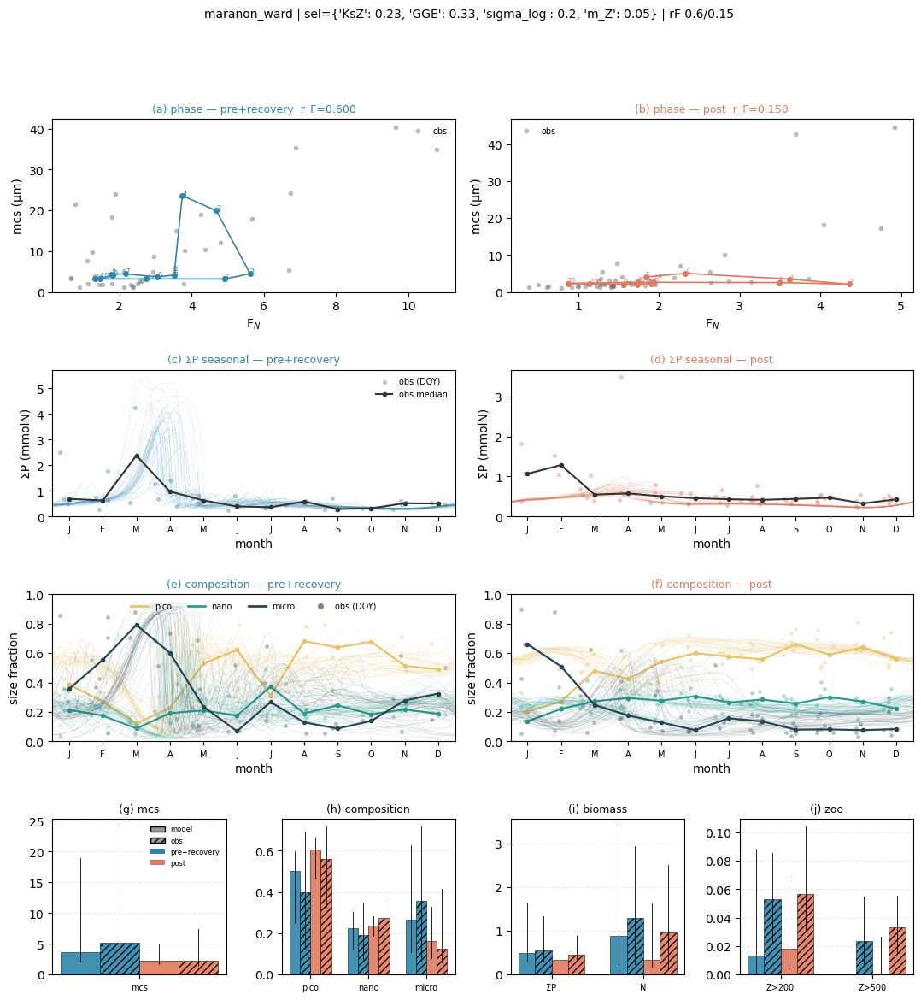

pre+recovery   squiggle  ΣP 0.298   micro 0.354   (interannual cycle spread / mean — HIGH = spaghetti)
post           squiggle  ΣP 0.099   micro 0.397   (interannual cycle spread / mean — HIGH = spaghetti)


In [27]:
runs, clims = fig4_overview(RP, RQ, 0.6, 0.2, sel={'KsZ':0.23,'GGE':0.31,'sigma_log':0.15,'m_Z':0.1})  # the squiggly one
squiggle_report(runs)
runs, clims = fig4_overview(RP, RQ, 0.6, 0.15, sel={'KsZ':0.23,'GGE':0.33,'sigma_log':0.20,'m_Z':0.05}) # your cleaner candidate
squiggle_report(runs)

n_harmonics=3: squiggle ΣP 0.401 | cv 0.94 | pze 0.58
n_harmonics=2: squiggle ΣP 0.392 | cv 0.93 | pze 0.58


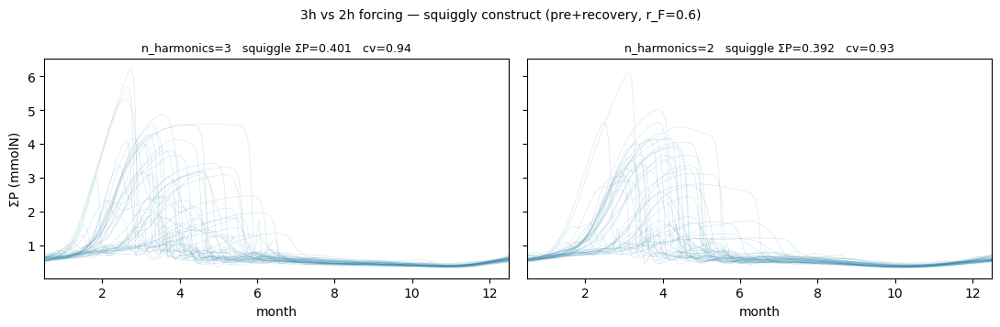

In [28]:
import numpy as np, matplotlib.pyplot as plt, seasonal_scan_harness as ssh
construct = ssh.allometry('maranon_ward'); FORC = ssh.build_forcings(['pre+recovery','post'])
HELD = {'DetritusSink':{'w_sink':5.0},'DetritusRemin':{'k_remin':0.04},
        'GrazingRouter':{'gge':0.31},'Grazing':{'KsZ':0.23,'sigma_log':0.15},
        'FishGrazing':{'frac_D':0.25,'frac_export':0.25},
        'ZooQuadMortality':{'frac_D':0.90,'frac_export':0.0},
        'ZooLinMortality':{'frac_D':0.90,'frac_export':0.0}}        # squiggly construct (squiggle 0.401)
MP,MZ,RF,G,SPIN = 0.0015, 0.10, 0.6, 'pre+recovery', 15
def _sq(r,key):
    keep=r['t']>=SPIN*365.0;t=r['t'][keep];v=np.asarray(r[key],float)[keep]
    yr=(t//365).astype(int);mo=np.clip(np.searchsorted(ssh._MEDGES,np.mod(t,365.0),'right')+1,1,12)
    ys=np.unique(yr);M=np.full((len(ys),12),np.nan)
    for i,y in enumerate(ys):
        for m in range(1,13):
            s=v[(yr==y)&(mo==m)]
            if s.size:M[i,m-1]=np.nanmean(s)
    return float(np.nanmean(np.nanstd(M,axis=0))/max(np.nanmean(v),1e-9))
def _daily(r,key):
    keep=r['t']>=SPIN*365.0;t=r['t'][keep];v=np.asarray(r[key],float)[keep];doy=np.mod(t,365.0);yr=(t//365).astype(int);out=[]
    for y in np.unique(yr):
        m=yr==y;o=np.argsort(doy[m]);out.append((doy[m][o]/30.4+0.5,v[m][o]))
    return out
fig,axes=plt.subplots(1,2,figsize=(11,3.6),sharey=True)
for ax,nh in zip(axes,(3,2)):
    clim,r=ssh.run_one(construct,FORC[G],fish_rate=RF,mP=MP,m_Z=MZ,iv_overrides=HELD,
                       years=60,spinup=SPIN,n_harmonics=nh,routed=True,return_traj=True)
    sq=_sq(r,'sumP')
    for d,v in _daily(r,'sumP'): ax.plot(d,v,'-',color='#2E86AB',alpha=.18,lw=.5)
    ax.set_title(f"n_harmonics={nh}   squiggle ΣP={sq:.3f}   cv={clim['cv_sumP']:.2f}",fontsize=9)
    ax.set_xlabel('month'); ax.set_xlim(.5,12.5)
    print(f"n_harmonics={nh}: squiggle ΣP {sq:.3f} | cv {clim['cv_sumP']:.2f} | pze {clim['pze']:.2f}")
axes[0].set_ylabel('ΣP (mmolN)')
fig.suptitle(f"3h vs 2h forcing — squiggly construct ({G}, r_F={RF})",fontsize=10)
fig.tight_layout(); plt.show()

squiggly construct, pre+recovery r_F=0.6, k_remin=0.04, 3h forcing
 w_sink   L(m)  squiggle    cv   pze   sumP
    2.5     62     0.332  0.88  0.47   1.01
      3     75     0.196  0.85  0.50   1.03
      5    125     0.401  0.94  0.58   0.90
      6    150     0.375  0.88  0.60   0.89
      7    175     0.409  0.91  0.61   0.93
      8    200     0.385  0.85  0.63   0.84


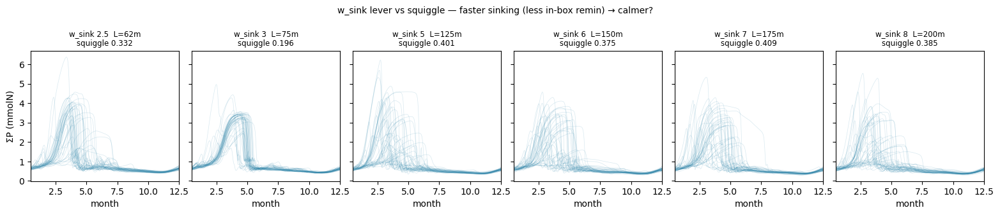

In [30]:
import numpy as np, matplotlib.pyplot as plt, seasonal_scan_harness as ssh
construct=ssh.allometry('maranon_ward'); FORC=ssh.build_forcings(['pre+recovery','post'])
G,RF,MP,MZ,KR,SPIN = 'pre+recovery',0.6,0.0015,0.10,0.04,15
WS=[2.5,3,5,6,7,8]
base=lambda ws: {'DetritusSink':{'w_sink':ws},'DetritusRemin':{'k_remin':KR},
        'GrazingRouter':{'gge':0.31},'Grazing':{'KsZ':0.23,'sigma_log':0.15},
        'FishGrazing':{'frac_D':0.25,'frac_export':0.25},
        'ZooQuadMortality':{'frac_D':0.90,'frac_export':0.0},
        'ZooLinMortality':{'frac_D':0.90,'frac_export':0.0}}
def _sq(r,key):
    keep=r['t']>=SPIN*365.0;t=r['t'][keep];v=np.asarray(r[key],float)[keep]
    yr=(t//365).astype(int);mo=np.clip(np.searchsorted(ssh._MEDGES,np.mod(t,365.0),'right')+1,1,12)
    ys=np.unique(yr);M=np.full((len(ys),12),np.nan)
    for i,y in enumerate(ys):
        for m in range(1,13):
            s=v[(yr==y)&(mo==m)]
            if s.size:M[i,m-1]=np.nanmean(s)
    return float(np.nanmean(np.nanstd(M,axis=0))/max(np.nanmean(v),1e-9))
def _daily(r,key):
    keep=r['t']>=SPIN*365.0;t=r['t'][keep];v=np.asarray(r[key],float)[keep];doy=np.mod(t,365.0);yr=(t//365).astype(int);out=[]
    for y in np.unique(yr):
        m=yr==y;o=np.argsort(doy[m]);out.append((doy[m][o]/30.4+0.5,v[m][o]))
    return out
fig,axes=plt.subplots(1,len(WS),figsize=(2.6*len(WS),3.4),sharey=True)
print(f"squiggly construct, {G} r_F={RF}, k_remin={KR}, 3h forcing")
print(f"{'w_sink':>7}{'L(m)':>7}{'squiggle':>10}{'cv':>6}{'pze':>6}{'sumP':>7}")
for ax,ws in zip(axes,WS):
    clim,r=ssh.run_one(construct,FORC[G],fish_rate=RF,mP=MP,m_Z=MZ,iv_overrides=base(ws),
                       years=60,spinup=SPIN,n_harmonics=3,routed=True,return_traj=True)
    sq=_sq(r,'sumP')
    for d,v in _daily(r,'sumP'): ax.plot(d,v,'-',color='#2E86AB',alpha=.18,lw=.5)
    ax.set_title(f"w_sink {ws}  L={ws/KR:.0f}m\nsquiggle {sq:.3f}",fontsize=8.5); ax.set_xlabel('month'); ax.set_xlim(.5,12.5)
    print(f"{ws:>7}{ws/KR:>7.0f}{sq:>10.3f}{clim['cv_sumP']:>6.2f}{clim['pze']:>6.2f}{clim['sumP']:>7.2f}")
axes[0].set_ylabel('ΣP (mmolN)')
fig.suptitle("w_sink lever vs squiggle — faster sinking (less in-box remin) → calmer?",fontsize=10)
fig.tight_layout(); plt.show()

squiggle ΣP 0.405 | cv 0.94 | ACF 1yr +0.45 / 5yr +0.43 (both high=clean periodic; 5yr«1yr=irregular) | interannual power>1.3yr 7% | dom period 1.00yr


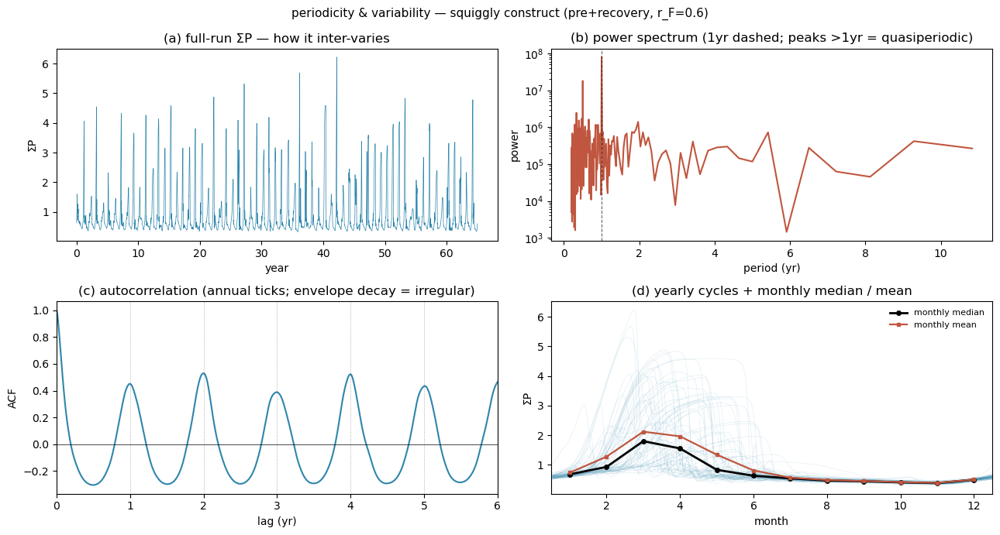

In [31]:
import numpy as np, matplotlib.pyplot as plt, seasonal_scan_harness as ssh
construct=ssh.allometry('maranon_ward'); FORC=ssh.build_forcings(['pre+recovery','post'])
G,RF,SPIN = 'pre+recovery',0.6,15
HELD={'DetritusSink':{'w_sink':5.0},'DetritusRemin':{'k_remin':0.04},
      'GrazingRouter':{'gge':0.31},'Grazing':{'KsZ':0.23,'sigma_log':0.15},
      'FishGrazing':{'frac_D':0.25,'frac_export':0.25},
      'ZooQuadMortality':{'frac_D':0.90,'frac_export':0.0},
      'ZooLinMortality':{'frac_D':0.90,'frac_export':0.0}}        # squiggly construct (swap to inspect another)
clim,r=ssh.run_one(construct,FORC[G],fish_rate=RF,mP=0.0015,m_Z=0.10,iv_overrides=HELD,
                   years=80,spinup=SPIN,n_harmonics=3,routed=True,return_traj=True)   # 80yr for spectral resolution
keep=r['t']>=SPIN*365.0; t=r['t'][keep]; P=np.asarray(r['sumP'],float)[keep]
yrs=(t-t[0])/365.0; doy=np.mod(t,365.0); yr=(t//365).astype(int); _MO=np.arange(1,13)
mo=np.clip(np.searchsorted(ssh._MEDGES,doy,'right')+1,1,12)
x=P-P.mean(); n=len(x); f=np.fft.rfftfreq(n,1.0); pw=np.abs(np.fft.rfft(x))**2
per=1.0/np.maximum(f,1e-9)/365.0; band=(per>0.2)&(per<12)
ac=np.correlate(x,x,'full')[n-1:]/np.sum(x**2)
iafrac=float(np.sum(pw[(per>1.3)&(per<12)])/np.sum(pw[band]))
def sq(v):
    M=np.full((len(np.unique(yr)),12),np.nan)
    for i,y in enumerate(np.unique(yr)):
        for mm in range(1,13):
            s=v[(yr==y)&(mo==mm)]
            if s.size:M[i,mm-1]=np.nanmean(s)
    return float(np.nanmean(np.nanstd(M,0))/max(np.nanmean(v),1e-9))
print(f"squiggle ΣP {sq(P):.3f} | cv {clim['cv_sumP']:.2f} | ACF 1yr {ac[365]:+.2f} / 5yr {ac[5*365]:+.2f} "
      f"(both high=clean periodic; 5yr«1yr=irregular) | interannual power>1.3yr {100*iafrac:.0f}% | "
      f"dom period {per[band][np.argmax(pw[band])]:.2f}yr")
fig,ax=plt.subplots(2,2,figsize=(13,7))
ax[0,0].plot(yrs,P,lw=.5,color='#2E86AB'); ax[0,0].set_title('(a) full-run ΣP — how it inter-varies'); ax[0,0].set_xlabel('year'); ax[0,0].set_ylabel('ΣP')
ax[0,1].semilogy(per[band],pw[band],color='#C0563F'); ax[0,1].axvline(1,ls='--',color='k',lw=.8,alpha=.6)
ax[0,1].set_title('(b) power spectrum (1yr dashed; peaks >1yr = quasiperiodic)'); ax[0,1].set_xlabel('period (yr)'); ax[0,1].set_ylabel('power')
ax[1,0].plot(np.arange(len(ac))/365.0,ac,color='#2E86AB')
for k in range(1,7): ax[1,0].axvline(k,ls=':',color='k',lw=.6,alpha=.4)
ax[1,0].axhline(0,color='k',lw=.5); ax[1,0].set_xlim(0,6); ax[1,0].set_title('(c) autocorrelation (annual ticks; envelope decay = irregular)'); ax[1,0].set_xlabel('lag (yr)'); ax[1,0].set_ylabel('ACF')
for y in np.unique(yr):
    s=yr==y; o=np.argsort(doy[s]); ax[1,1].plot(doy[s][o]/30.4+0.5,P[s][o],color='#2E86AB',alpha=.13,lw=.5)
ax[1,1].plot(_MO,[np.nanmedian(P[mo==mm]) for mm in _MO],'-o',color='k',lw=2,ms=4,label='monthly median')
ax[1,1].plot(_MO,[np.nanmean(P[mo==mm]) for mm in _MO],'-s',color='#C0563F',lw=1.6,ms=3,label='monthly mean')
ax[1,1].set_xlim(.5,12.5); ax[1,1].set_title('(d) yearly cycles + monthly median / mean'); ax[1,1].set_xlabel('month'); ax[1,1].set_ylabel('ΣP'); ax[1,1].legend(fontsize=8,frameon=False)
fig.suptitle(f"periodicity & variability — squiggly construct ({G}, r_F={RF})",fontsize=11); fig.tight_layout(); plt.show()